# <font color=red>Aerial Bombing Operations in World War II</font>

## <font color=red>Content</font>
### This dataset consists of digitized paper mission reports from WWII. Each record includes the date, conflict, geographic location, and other data elements to form a live-action sequence of air warfare from 1939 to 1945. The records include U.S. and Royal Air Force data, in addition to some Australian, New Zealand and South African air force missions.

## <font color=red>Acknowledgements</font>
### Lt Col Jenns Robertson of the US Air Force developed the Theater History of Operations Reports (THOR) and posted them online after receiving Department of Defense approval.

### <font color=red>The exercise consists of seven questions, each involving creating a different type of plot and applying inference to address a question related to the challenge.</font>

In [ ]:
library("ggplot2", quietly = TRUE)
library("dplyr", quietly = TRUE)
library("knitr", quietly = TRUE)
library("stringr", quietly = TRUE)
library("tidyr", quietly = TRUE)
library("plotly", quietly = TRUE)
library("ggthemes", quietly = TRUE)
library("hrbrthemes", quietly = TRUE)
library("gcookbook", quietly = TRUE)
library("tidyverse", quietly = TRUE)
library("scales", quietly = TRUE)
library('viridis', quietly = TRUE)
library('maps', quietly = TRUE)
library('ggridges', quietly = TRUE)

options(warn=-1)
# options(warn=0)

In [11]:
air_operations <- read.csv(file="./data/operations.csv", stringsAsFactors = F)


In [27]:
air_operations[air_operations$Theater.of.Operations == 'Unknown']

1
2
3
4
5
6
7
8
9
10
11


In [12]:
air_operations$Theater.of.Operations <- ifelse(air_operations$Theater.of.Operations == "","NA",str_trim(air_operations$Theater.of.Operations))

# Lookup table for theater names
lut <- c("MTO" = "Mediterranean Theater","PTO" = "Pacific Theater", "ETO" = "European Theater","CBI" = "China Burma India","EAST AFRICA" = "East Africa","MADAGASCAR" = "Madagascar","NA" = "Unknown")

air_operations$Theater.of.Operations.Name <- lut[air_operations$Theater.of.Operations]

# Extract Year and Month
air_operations$Mission.Date.Month <- format(as.Date(air_operations$Mission.Date, format="%m/%d/%Y"),"%m")
air_operations$Mission.Date.Year_Month <- format(as.Date(air_operations$Mission.Date, format="%m/%d/%Y"),"%Y-%m")
air_operations$Mission.Date.Year <- format(as.Date(air_operations$Mission.Date, format="%m/%d/%Y"),"%Y")

# Format target country and city 
air_operations$Target.Country <- str_to_title(air_operations$Target.Country)
air_operations$Target.City <- str_to_title(air_operations$Target.City)

In [13]:
# view data head
head(air_operations)

,Mission.ID,Mission.Date,Theater.of.Operations,Country,Air.Force,Unit.ID,Aircraft.Series,Callsign,Mission.Type,Takeoff.Base,...,Fragmentation.Devices.Weight..Tons.,Total.Weight..Pounds.,Total.Weight..Tons.,Time.Over.Target,Bomb.Damage.Assessment,Source.ID,Theater.of.Operations.Name,Mission.Date.Month,Mission.Date.Year_Month,Mission.Date.Year
,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>
1,1,8/15/1943,MTO,USA,12 AF,27 FBG/86 FBG,A36,,,PONTE OLIVO AIRFIELD,...,NA,NA,10.0,,,NA,Mediterranean Theater,08,1943-08,1943
2,2,8/15/1943,PTO,USA,5 AF,400 BS,B24,,1,,...,NA,NA,20.0,,,9366,Pacific Theater,08,1943-08,1943
3,3,8/15/1943,MTO,USA,12 AF,27 FBG/86 FBG,A36,,,PONTE OLIVO AIRFIELD,...,NA,NA,9.0,,,NA,Mediterranean Theater,08,1943-08,1943
4,4,8/15/1943,MTO,USA,12 AF,27 FBG/86 FBG,A36,,,PONTE OLIVO AIRFIELD,...,NA,NA,7.5,,,NA,Mediterranean Theater,08,1943-08,1943
5,5,8/15/1943,PTO,USA,5 AF,321 BS,B24,,1,,...,NA,NA,8.0,,,22585,Pacific Theater,08,1943-08,1943
6,6,8/15/1943,PTO,USA,5 AF,319 BS,B24,,1,,...,NA,NA,4.0,,,9349,Pacific Theater,08,1943-08,1943


In [14]:
colnames(air_operations)

[1] "Mission.ID"                           
 [2] "Mission.Date"                         
 [3] "Theater.of.Operations"                
 [4] "Country"                              
 [5] "Air.Force"                            
 [6] "Unit.ID"                              
 [7] "Aircraft.Series"                      
 [8] "Callsign"                             
 [9] "Mission.Type"                         
[10] "Takeoff.Base"                         
[11] "Takeoff.Location"                     
[12] "Takeoff.Latitude"                     
[13] "Takeoff.Longitude"                    
[14] "Target.ID"                            
[15] "Target.Country"                       
[16] "Target.City"                          
[17] "Target.Type"                          
[18] "Target.Industry"                      
[19] "Target.Priority"                      
[20] "Target.Latitude"                      
[21] "Target.Longitude"                     
[22] "Altitude..Hundreds.of.Feet."          
[23] "Airborne.Aircraft"                    
[24] "Attacking.Aircraft"                   
[25] "Bombing.Aircraft"                     
[26] "Aircraft.Returned"                    
[27] "Aircraft.Failed"                      
[28] "Aircraft.Damaged"                     
[29] "Aircraft.Lost"                        
[30] "High.Explosives"                      
[31] "High.Explosives.Type"                 
[32] "High.Explosives.Weight..Pounds."      
[33] "High.Explosives.Weight..Tons."        
[34] "Incendiary.Devices"                   
[35] "Incendiary.Devices.Type"              
[36] "Incendiary.Devices.Weight..Pounds."   
[37] "Incendiary.Devices.Weight..Tons."     
[38] "Fragmentation.Devices"                
[39] "Fragmentation.Devices.Type"           
[40] "Fragmentation.Devices.Weight..Pounds."
[41] "Fragmentation.Devices.Weight..Tons."  
[42] "Total.Weight..Pounds."                
[43] "Total.Weight..Tons."                  
[44] "Time.Over.Target"                     
[45] "Bomb.Damage.Assessment"               
[46] "Source.ID"                            
[47] "Theater.of.Operations.Name"           
[48] "Mission.Date.Month"                   
[49] "Mission.Date.Year_Month"              
[50] "Mission.Date.Year"

In [15]:
print(nrow(air_operations))
air_operations <- unique(air_operations)
print(nrow(air_operations))

[1] 178281
[1] 178281


### <font color=red>1. What is the distribution of the aerial bombing operations conducted in the major Theaters, e.g., European (ETO), Pacific (PTO), Mediterranean (MTO), etc. from 1939 to 1945? What are the key insights that you derive from this visualisation?</font>

This graph shows that most air battles occurred in the European Theater. The European theater accounts for over half of all air warfare in the second world war. However in the final years, the Mediterranean and Pacific Theaters became more popular. 

In [16]:
# cast year to int
air_operations$Mission.Date.Year <- as.integer(air_operations$Mission.Date.Year)

In [17]:
# get row count
air_operations_count <- nrow(air_operations)
print(air_operations_count)

# filter data by year 
air_operations_subset <- air_operations %>% filter(Mission.Date.Year >= 1939 & Mission.Date.Year <= 1945)

# get row count
print(nrow(air_operations_subset))

[1] 178281
[1] 178281


In [18]:
colnames(air_operations)

[1] "Mission.ID"                           
 [2] "Mission.Date"                         
 [3] "Theater.of.Operations"                
 [4] "Country"                              
 [5] "Air.Force"                            
 [6] "Unit.ID"                              
 [7] "Aircraft.Series"                      
 [8] "Callsign"                             
 [9] "Mission.Type"                         
[10] "Takeoff.Base"                         
[11] "Takeoff.Location"                     
[12] "Takeoff.Latitude"                     
[13] "Takeoff.Longitude"                    
[14] "Target.ID"                            
[15] "Target.Country"                       
[16] "Target.City"                          
[17] "Target.Type"                          
[18] "Target.Industry"                      
[19] "Target.Priority"                      
[20] "Target.Latitude"                      
[21] "Target.Longitude"                     
[22] "Altitude..Hundreds.of.Feet."          
[23] "Airborne.Aircraft"                    
[24] "Attacking.Aircraft"                   
[25] "Bombing.Aircraft"                     
[26] "Aircraft.Returned"                    
[27] "Aircraft.Failed"                      
[28] "Aircraft.Damaged"                     
[29] "Aircraft.Lost"                        
[30] "High.Explosives"                      
[31] "High.Explosives.Type"                 
[32] "High.Explosives.Weight..Pounds."      
[33] "High.Explosives.Weight..Tons."        
[34] "Incendiary.Devices"                   
[35] "Incendiary.Devices.Type"              
[36] "Incendiary.Devices.Weight..Pounds."   
[37] "Incendiary.Devices.Weight..Tons."     
[38] "Fragmentation.Devices"                
[39] "Fragmentation.Devices.Type"           
[40] "Fragmentation.Devices.Weight..Pounds."
[41] "Fragmentation.Devices.Weight..Tons."  
[42] "Total.Weight..Pounds."                
[43] "Total.Weight..Tons."                  
[44] "Time.Over.Target"                     
[45] "Bomb.Damage.Assessment"               
[46] "Source.ID"                            
[47] "Theater.of.Operations.Name"           
[48] "Mission.Date.Month"                   
[49] "Mission.Date.Year_Month"              
[50] "Mission.Date.Year"

In [19]:
# group by theater of operations
air_operations_subset_grouped <- air_operations_subset %>% group_by(Theater.of.Operations.Name) %>% summarise(Count = n())

# sort by count
air_operations_subset_grouped <- air_operations_subset_grouped[order(-air_operations_subset_grouped$Count),]
# - reverses the sort order
air_operations_subset_grouped

Theater.of.Operations.Name,Count
<chr>,<int>
European Theater,95827
Pacific Theater,36192
Mediterranean Theater,30532
China Burma India,12404
Unknown,3158
East Africa,142
Madagascar,26


In [20]:

# Reorder the factor levels based on Count
air_operations_subset_grouped$Theater.of.Operations.Name <- factor(air_operations_subset_grouped$Theater.of.Operations.Name, 
                                                                   levels = air_operations_subset_grouped$Theater.of.Operations.Name[order(-air_operations_subset_grouped$Count)])
# factor levels allow to control the order of the bars in the plot it must be a factor level because it is a categorical variable

In [21]:
air_operations_subset_grouped

Theater.of.Operations.Name,Count
<fct>,<int>
European Theater,95827
Pacific Theater,36192
Mediterranean Theater,30532
China Burma India,12404
Unknown,3158
East Africa,142
Madagascar,26


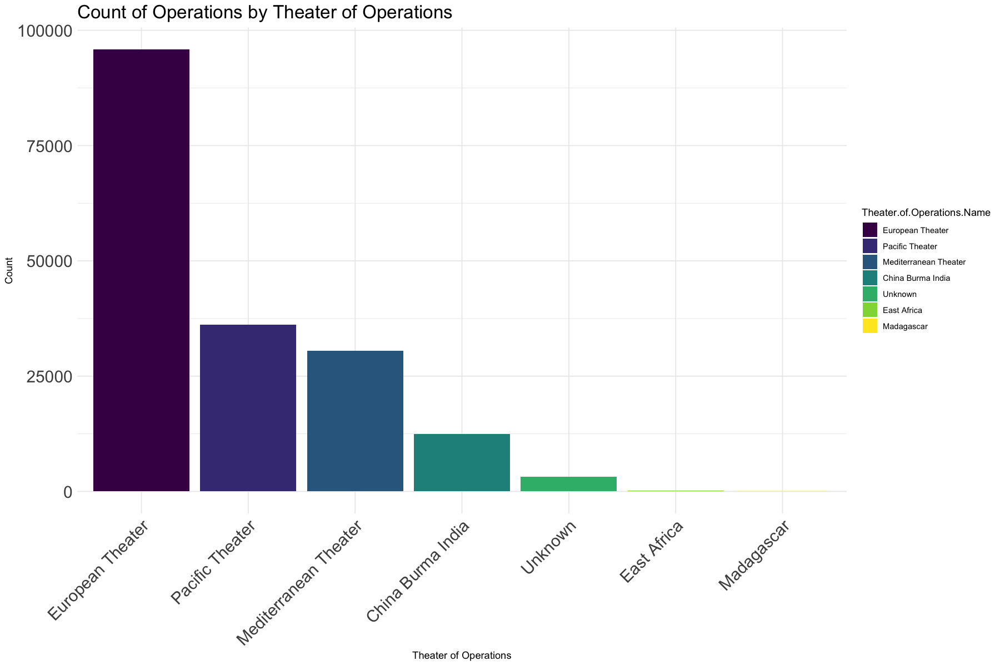

In [22]:
# Adjust factor levels based on the ordering in operations_summary
# increase the size of the plot
options(repr.plot.width=15, repr.plot.height=10)
# increase font size

# Plot
ggplot(air_operations_subset_grouped, aes(x = Theater.of.Operations.Name, y = Count, fill = Theater.of.Operations.Name)) +
  geom_col() +
  scale_fill_viridis_d() +  # Assuming viridis is desired and available
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 18),
  axis.text.y = element_text( size = 18), 
  plot.title = element_text( size = 20)) +
  labs(title = "Count of Operations by Theater of Operations", x = "Theater of Operations", y = "Count")


In [23]:
air_operations_subset_grouped_year <- air_operations_subset %>% group_by(Mission.Date.Year,Theater.of.Operations.Name) %>% summarise(Count = n(), .groups = 'drop')

# get years
years <- unique(air_operations_subset$Mission.Date.Year)

# get unique theaters
theaters <- unique(air_operations_subset$Theater.of.Operations.Name)

all_year_theater_combinations <- expand.grid(Mission.Date.Year = years, Theater.of.Operations.Name = theaters)

# merge the data
air_operations_subset_year_theater <- all_year_theater_combinations %>% left_join(air_operations_subset_grouped_year, by = c("Mission.Date.Year", "Theater.of.Operations.Name"))

# fill na with 0
air_operations_subset_year_theater$Count[is.na(air_operations_subset_year_theater$Count)] <- 0

$x
[1] "Theater of Operations"

$y
[1] "Count"

$title
[1] "Count of Operations by Theater of Operations"

attr(,"class")
[1] "labels"

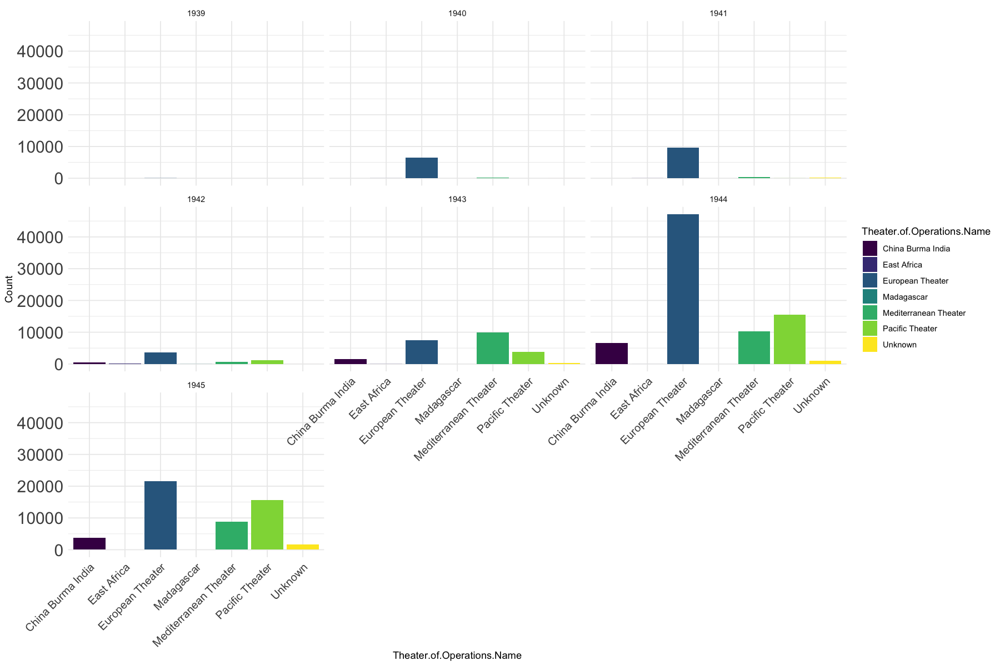

In [24]:
# Adjust factor levels based on the ordering in operations_summary
# increase the size of the plot
options(repr.plot.width=15, repr.plot.height=10)
# increase font size

# Plot
ggplot(air_operations_subset_year_theater, aes(x = Theater.of.Operations.Name, 
y = Count, fill = Theater.of.Operations.Name)) +
  geom_col() +
  scale_fill_viridis_d() +  # Assuming viridis is desired and available
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 12),
  axis.text.y = element_text( size = 18), 
  plot.title = element_text( size = 20)) +
  facet_wrap(~ Mission.Date.Year)
  labs(title = "Count of Operations by Theater of Operations", x = "Theater of Operations", y = "Count")


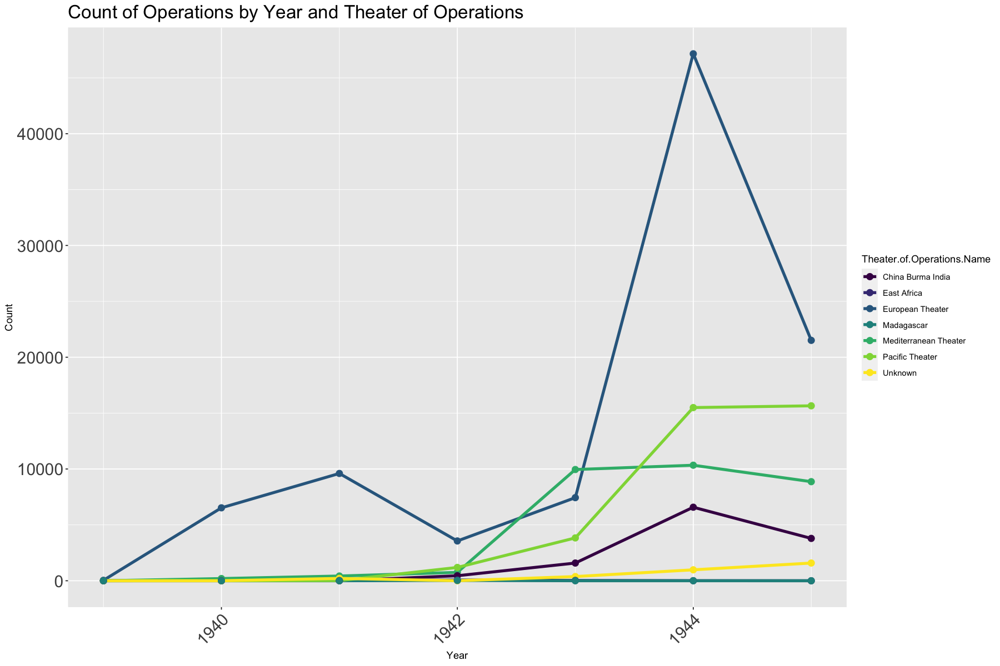

In [25]:


# Assuming air_operations_subset_grouped_year is already created as shown
ggplot(air_operations_subset_year_theater, aes(x = Mission.Date.Year, y = Count, color = Theater.of.Operations.Name, group = Theater.of.Operations.Name)) +
  geom_line(size = 1.5) +  # Increase line size; adjust the number as needed for desired thickness
  geom_point(size = 3) +
  scale_color_viridis_d() +  # Use scale_color_viridis_d() for line colors
  theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 18),
        axis.text.y = element_text(size = 18), 
        plot.title = element_text(size = 20)) +
  labs(title = "Count of Operations by Year and Theater of Operations", x = "Year", y = "Count")


In [26]:
# get values for the top theater of operations

top_theater_of_operations <- air_operations_subset_grouped[1,]$Count
all_theater_of_operations <- sum(air_operations_subset_grouped$Count) 
top_theater_of_operations/(all_theater_of_operations)

[1] 0.5375054

### <font color=red>2. Show a summary of a percentage of the total aerial bombing operations by Theater of operations by means of a bar chart. Which are the three Theaters where the most aerial bombing operations occured?</font>

European, Pacific, and Mediterranean Theaters 

In [124]:
colnames(air_operations)

[1] "Mission.ID"                           
 [2] "Mission.Date"                         
 [3] "Theater.of.Operations"                
 [4] "Country"                              
 [5] "Air.Force"                            
 [6] "Unit.ID"                              
 [7] "Aircraft.Series"                      
 [8] "Callsign"                             
 [9] "Mission.Type"                         
[10] "Takeoff.Base"                         
[11] "Takeoff.Location"                     
[12] "Takeoff.Latitude"                     
[13] "Takeoff.Longitude"                    
[14] "Target.ID"                            
[15] "Target.Country"                       
[16] "Target.City"                          
[17] "Target.Type"                          
[18] "Target.Industry"                      
[19] "Target.Priority"                      
[20] "Target.Latitude"                      
[21] "Target.Longitude"                     
[22] "Altitude..Hundreds.of.Feet."          
[23] "Airborne.Aircraft"                    
[24] "Attacking.Aircraft"                   
[25] "Bombing.Aircraft"                     
[26] "Aircraft.Returned"                    
[27] "Aircraft.Failed"                      
[28] "Aircraft.Damaged"                     
[29] "Aircraft.Lost"                        
[30] "High.Explosives"                      
[31] "High.Explosives.Type"                 
[32] "High.Explosives.Weight..Pounds."      
[33] "High.Explosives.Weight..Tons."        
[34] "Incendiary.Devices"                   
[35] "Incendiary.Devices.Type"              
[36] "Incendiary.Devices.Weight..Pounds."   
[37] "Incendiary.Devices.Weight..Tons."     
[38] "Fragmentation.Devices"                
[39] "Fragmentation.Devices.Type"           
[40] "Fragmentation.Devices.Weight..Pounds."
[41] "Fragmentation.Devices.Weight..Tons."  
[42] "Total.Weight..Pounds."                
[43] "Total.Weight..Tons."                  
[44] "Time.Over.Target"                     
[45] "Bomb.Damage.Assessment"               
[46] "Source.ID"                            
[47] "Theater.of.Operations.Name"           
[48] "Mission.Date.Month"                   
[49] "Mission.Date.Year_Month"              
[50] "Mission.Date.Year"

In [125]:
air_operations_grouped_theater <- air_operations %>% group_by(Theater.of.Operations.Name) %>% summarise(Count = n(), .groups = 'drop')

# create a columns with % of total
air_operations_grouped_theater$Percent_of_Total <- (air_operations_grouped_theater$Count/sum(air_operations_grouped_theater$Count))*100

air_operations_grouped_theater <- air_operations_grouped_theater[order(-air_operations_grouped_theater$Percent_of_Total),]


# Reorder the factor levels based on Count
air_operations_grouped_theater$Theater.of.Operations.Name <- factor(air_operations_grouped_theater$Theater.of.Operations.Name, 
                                                                   levels = air_operations_grouped_theater$Theater.of.Operations.Name[order(-air_operations_grouped_theater$Percent_of_Total)])
# factor levels allow to control the order of the bars in the plot it must be a factor level because it is a categorical variable

air_operations_grouped_theater

Theater.of.Operations.Name,Count,Percent_of_Total
<fct>,<int>,<dbl>
European Theater,95827,53.75053988
Pacific Theater,36192,20.30053679
Mediterranean Theater,30532,17.12577336
China Burma India,12404,6.95755577
Unknown,3158,1.77136094
East Africa,142,0.07964954
Madagascar,26,0.01458372


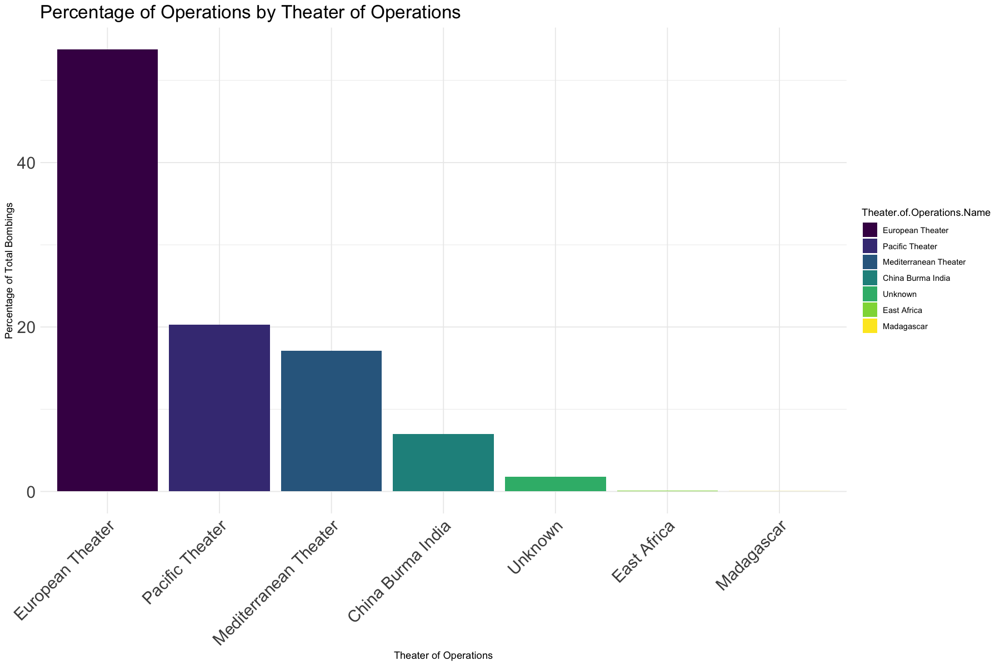

In [126]:
# Adjust factor levels based on the ordering in operations_summary
# increase the size of the plot
options(repr.plot.width=15, repr.plot.height=10)
# increase font size

# Plot
ggplot(air_operations_grouped_theater, aes(x = Theater.of.Operations.Name, y = Percent_of_Total, fill = Theater.of.Operations.Name)) +
  geom_col() +
  scale_fill_viridis_d() +  # Assuming viridis is desired and available
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 18),
  axis.text.y = element_text( size = 18), 
  plot.title = element_text( size = 20)) +
  labs(title = "Percentage of Operations by Theater of Operations", x = "Theater of Operations", y = "Percentage of Total Bombings")


European, Pacific and Mediterranean Theaters had the most bombings. 

### <font color=red>3. Plot a summary of the total aerial bombing operations by target countries.</font>

In [127]:
colnames(air_operations)


[1] "Mission.ID"                           
 [2] "Mission.Date"                         
 [3] "Theater.of.Operations"                
 [4] "Country"                              
 [5] "Air.Force"                            
 [6] "Unit.ID"                              
 [7] "Aircraft.Series"                      
 [8] "Callsign"                             
 [9] "Mission.Type"                         
[10] "Takeoff.Base"                         
[11] "Takeoff.Location"                     
[12] "Takeoff.Latitude"                     
[13] "Takeoff.Longitude"                    
[14] "Target.ID"                            
[15] "Target.Country"                       
[16] "Target.City"                          
[17] "Target.Type"                          
[18] "Target.Industry"                      
[19] "Target.Priority"                      
[20] "Target.Latitude"                      
[21] "Target.Longitude"                     
[22] "Altitude..Hundreds.of.Feet."          
[23] "Airborne.Aircraft"                    
[24] "Attacking.Aircraft"                   
[25] "Bombing.Aircraft"                     
[26] "Aircraft.Returned"                    
[27] "Aircraft.Failed"                      
[28] "Aircraft.Damaged"                     
[29] "Aircraft.Lost"                        
[30] "High.Explosives"                      
[31] "High.Explosives.Type"                 
[32] "High.Explosives.Weight..Pounds."      
[33] "High.Explosives.Weight..Tons."        
[34] "Incendiary.Devices"                   
[35] "Incendiary.Devices.Type"              
[36] "Incendiary.Devices.Weight..Pounds."   
[37] "Incendiary.Devices.Weight..Tons."     
[38] "Fragmentation.Devices"                
[39] "Fragmentation.Devices.Type"           
[40] "Fragmentation.Devices.Weight..Pounds."
[41] "Fragmentation.Devices.Weight..Tons."  
[42] "Total.Weight..Pounds."                
[43] "Total.Weight..Tons."                  
[44] "Time.Over.Target"                     
[45] "Bomb.Damage.Assessment"               
[46] "Source.ID"                            
[47] "Theater.of.Operations.Name"           
[48] "Mission.Date.Month"                   
[49] "Mission.Date.Year_Month"              
[50] "Mission.Date.Year"

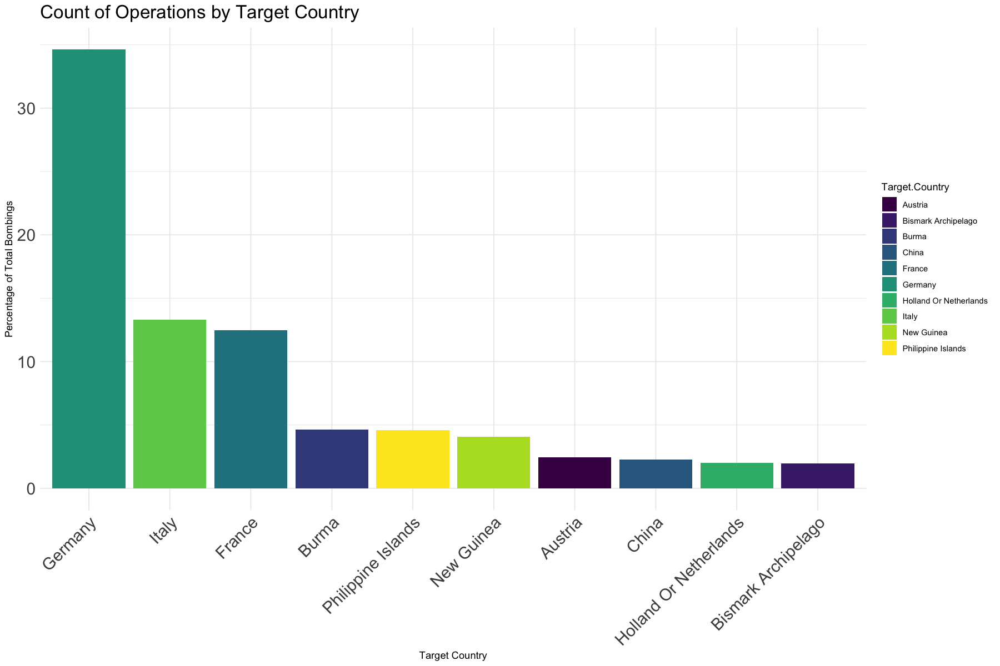

In [128]:

air_operations_target_countries <- air_operations %>%
  group_by(Target.Country) %>%
  summarise(
    Count = n(),
    IncendiaryPayload = sum(Incendiary.Devices.Weight..Tons., na.rm = TRUE),
    FragmentationPayload = sum(Fragmentation.Devices.Weight..Tons., na.rm = TRUE),
    HighExplosivesPayload = sum(High.Explosives.Weight..Tons., na.rm = TRUE),
    .groups = 'drop'  # Correct placement of comma before .groups
  )
  
# create a columns with % of total
air_operations_target_countries$Percent_of_Total <- (air_operations_target_countries$Count/sum(air_operations_target_countries$Count))*100

air_operations_target_countries <- air_operations_target_countries[order(-air_operations_target_countries$Percent_of_Total),]

air_operations_target_countries = air_operations_target_countries[1:10,]

ggplot(air_operations_target_countries, aes(x = reorder(Target.Country, -Percent_of_Total), y = Percent_of_Total, fill = Target.Country)) +
  geom_col() +
  scale_fill_viridis_d() +  # Assuming viridis is desired and available
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 18),
  axis.text.y = element_text( size = 18), 
  plot.title = element_text( size = 20)) +
  labs(title = "Count of Operations by Target Country", x = "Target Country", y = "Percentage of Total Bombings")

In [129]:
air_operations_target_countries <- air_operations %>% group_by(Theater.of.Operations.Name, Target.Country, Target.City, Target.Latitude, Target.Longitude) %>% 
summarise(
    Count = n(),
    IncendiaryPayload = sum(Incendiary.Devices.Weight..Tons., na.rm = TRUE),
    FragmentationPayload = sum(Fragmentation.Devices.Weight..Tons., na.rm = TRUE),
    HighExplosivesPayload = sum(High.Explosives.Weight..Tons., na.rm = TRUE),
    .groups = 'drop'  # Correct placement of comma before .groups
  )

# drop na countries
air_operations_target_countries <- air_operations_target_countries %>% filter(Target.Country != "")


In [130]:
colnames(air_operations_target_countries)

[1] "Theater.of.Operations.Name" "Target.Country"            
[3] "Target.City"                "Target.Latitude"           
[5] "Target.Longitude"           "Count"                     
[7] "IncendiaryPayload"          "FragmentationPayload"      
[9] "HighExplosivesPayload"

## European Visualizations

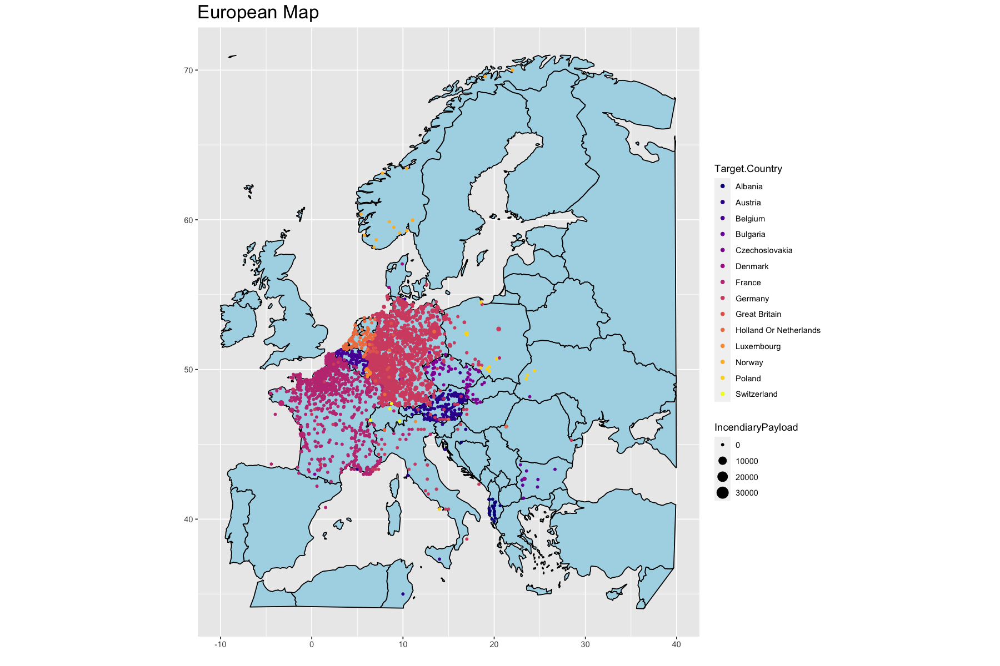

In [131]:

air_operations_target_countries_eu = air_operations_target_countries %>% filter(Theater.of.Operations.Name == "European Theater")

options(repr.plot.width=15, repr.plot.height=10)

world_map <- map_data("world")

# Filter for Europe by a rough range of longitudes and latitudes
europe_map <- world_map %>%
  filter(long > -10, long < 40, lat > 34, lat < 71)

ggplot(data = europe_map) +
  geom_polygon(aes(x = long, y = lat, group = group), fill = "lightblue", color = "black") +
  xlim(-10, 40) +  # Adjust these limits to fit Europe snugly within the plot area
  ylim(34, 71) +
  geom_point(data = air_operations_target_countries_eu, 
             aes(x = Target.Longitude, y = Target.Latitude, color = Target.Country, size=IncendiaryPayload)) +
  scale_color_viridis_d(option='plasma') +
  labs(title = "European Map", x = "", y = "") +
  theme(
  plot.title = element_text( size = 20)) +
  coord_quickmap()  # Use coord_quickmap for a better map projection


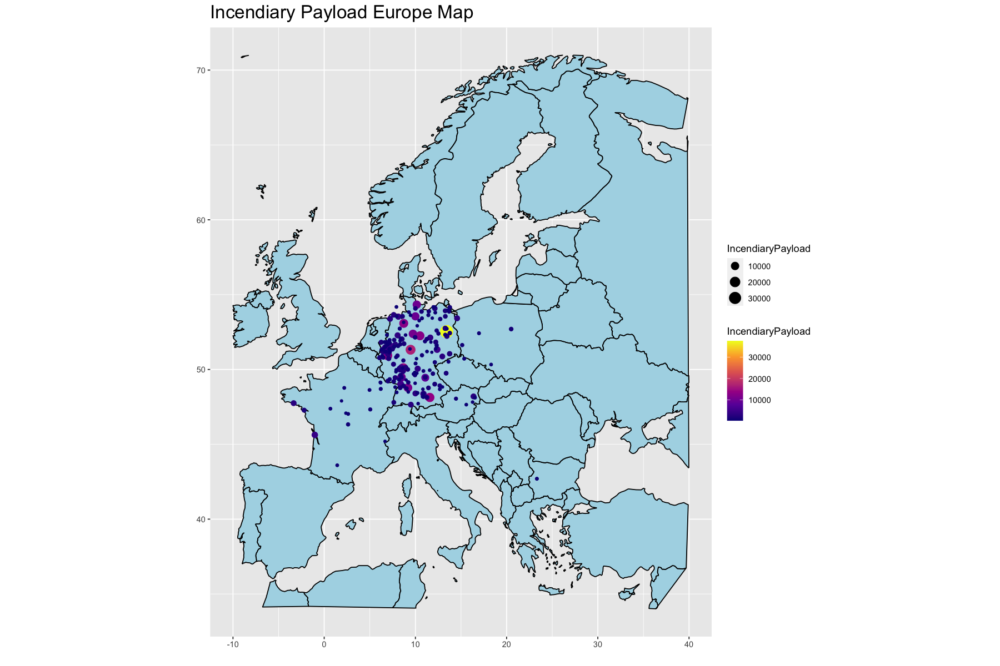

In [132]:

filtered_data <- air_operations_target_countries_eu %>%
  slice_max(order_by = IncendiaryPayload, n = 200)

options(repr.plot.width=15, repr.plot.height=10)

world_map <- map_data("world")

# Filter for Europe by a rough range of longitudes and latitudes
europe_map <- world_map %>%
  filter(long > -10, long < 40, lat > 34, lat < 71)

ggplot(data = europe_map) +
  geom_polygon(aes(x = long, y = lat, group = group), fill = "lightblue", color = "black") +
  xlim(-10, 40) +  # Adjust these limits to fit Europe snugly within the plot area
  ylim(34, 71) +
  scale_color_viridis_c(option = "plasma") +
  geom_point(data = filtered_data, 
             aes(x = Target.Longitude, y = Target.Latitude, color =IncendiaryPayload, size=IncendiaryPayload)) +
  labs(title = "Incendiary Payload Europe Map", x = "", y = "") +
  theme(
  plot.title = element_text( size = 20)) +
  coord_quickmap()  # Use coord_quickmap for a better map projection


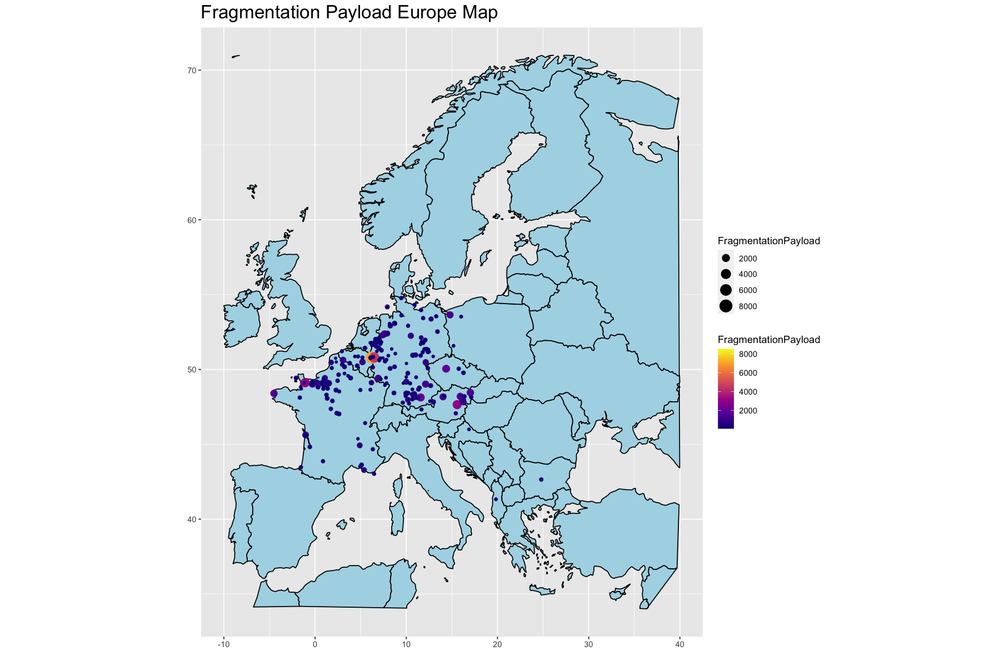

In [133]:

filtered_data <- air_operations_target_countries_eu %>%
  slice_max(order_by = FragmentationPayload, n = 200)

options(repr.plot.width=15, repr.plot.height=10)

world_map <- map_data("world")

# Filter for Europe by a rough range of longitudes and latitudes
europe_map <- world_map %>%
  filter(long > -10, long < 40, lat > 34, lat < 71)

ggplot(data = europe_map) +
  geom_polygon(aes(x = long, y = lat, group = group), fill = "lightblue", color = "black") +
  xlim(-10, 40) +  # Adjust these limits to fit Europe snugly within the plot area
  ylim(34, 71) +
  scale_color_viridis_c(option = "plasma") +
  geom_point(data = filtered_data, 
             aes(x = Target.Longitude, y = Target.Latitude, color =FragmentationPayload, size =FragmentationPayload)) +
  labs(title = "Fragmentation Payload Europe Map", x = "", y = "") +
  theme(
  plot.title = element_text( size = 20)) +
  coord_quickmap()  # Use coord_quickmap for a better map projection

  


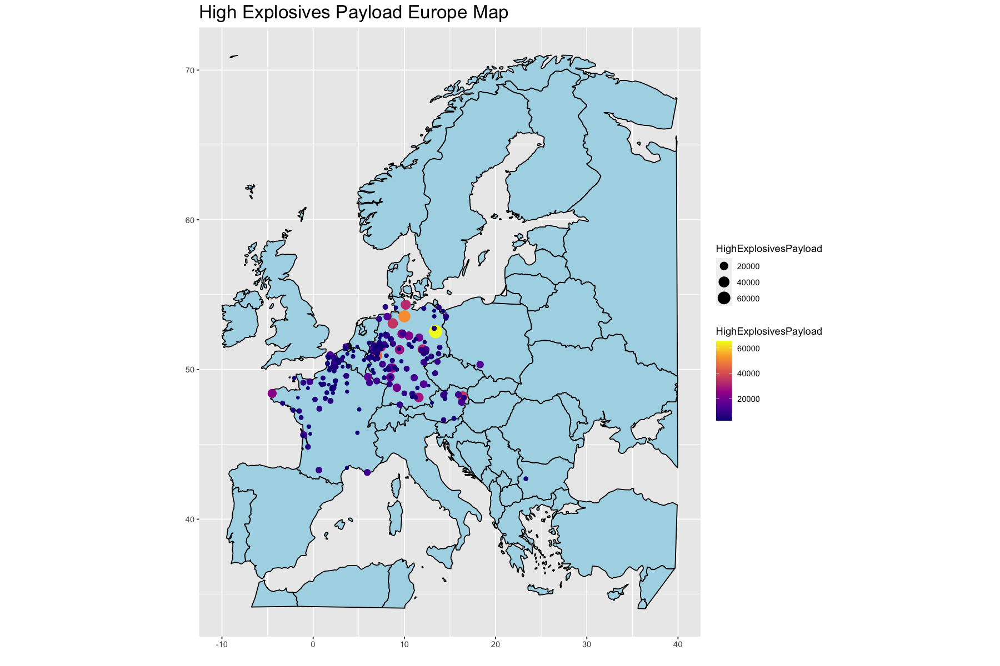

In [134]:

filtered_data <- air_operations_target_countries_eu %>%
  slice_max(order_by = HighExplosivesPayload, n = 200)

options(repr.plot.width=15, repr.plot.height=10)

world_map <- map_data("world")

# Filter for Europe by a rough range of longitudes and latitudes
europe_map <- world_map %>%
  filter(long > -10, long < 40, lat > 34, lat < 71)

ggplot(data = europe_map) +
  geom_polygon(aes(x = long, y = lat, group = group), fill = "lightblue", color = "black") +
  xlim(-10, 40) +  # Adjust these limits to fit Europe snugly within the plot area
  ylim(34, 71) +
  scale_color_viridis_c(option='plasma') +
  geom_point(data = filtered_data, 
             aes(x = Target.Longitude, y = Target.Latitude, color =HighExplosivesPayload, size=HighExplosivesPayload)) +
  labs(title = "High Explosives Payload Europe Map", x = "", y = "") +
  theme(
  plot.title = element_text( size = 20)) +
  coord_quickmap()  # Use coord_quickmap for a better map projection

  


## Mediterranean Visualizations

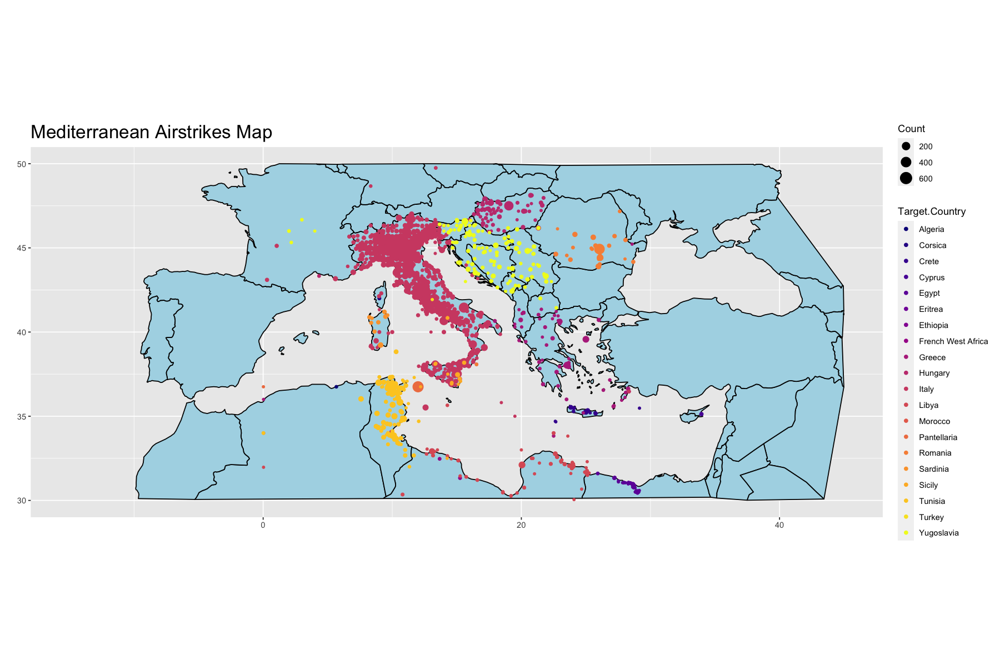

In [135]:

air_operations_target_countries_med = air_operations_target_countries %>% filter(Theater.of.Operations.Name == "Mediterranean Theater")

options(repr.plot.width=15, repr.plot.height=10)

world_map <- map_data("world")

# Filter for Europe by a rough range of longitudes and latitudes
mediterranean_map <- world_map %>%
  filter(long > -15, long < 45, lat > 30, lat < 50)

ggplot(data = mediterranean_map) +
  geom_polygon(aes(x = long, y = lat, group = group), fill = "lightblue", color = "black") +
  xlim(-15, 45) +  # Adjust these limits to fit Europe snugly within the plot area
  ylim(30, 50) +
  scale_color_viridis_d(option='plasma') +
  geom_point(data = air_operations_target_countries_med, 
             aes(x = Target.Longitude, y = Target.Latitude, color = Target.Country, size=Count)) +
  labs(title = "Mediterranean Airstrikes Map", x = "", y = "") +
  theme(
  plot.title = element_text( size = 20)) +
  coord_quickmap()  # Use coord_quickmap for a better map projection


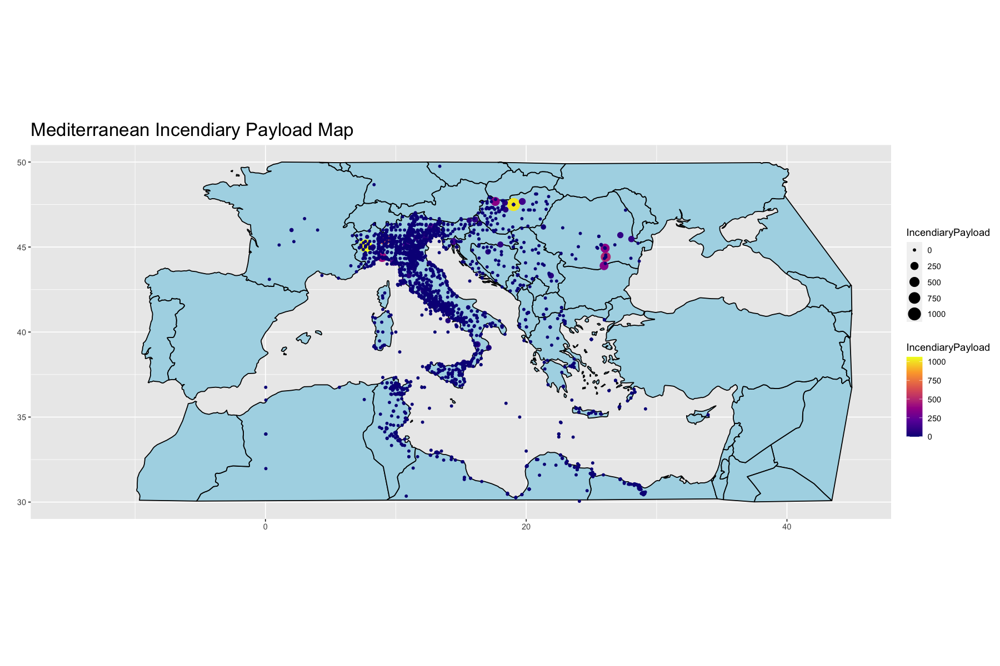

In [136]:


filtered_data <- air_operations_target_countries_med %>%
  slice_max(order_by = IncendiaryPayload, n = 300)
  
options(repr.plot.width=15, repr.plot.height=10)

world_map <- map_data("world")

# Filter for Europe by a rough range of longitudes and latitudes
mediterranean_map <- world_map %>%
  filter(long > -15, long < 45, lat > 30, lat < 50)

ggplot(data = mediterranean_map) +
  geom_polygon(aes(x = long, y = lat, group = group), fill = "lightblue", color = "black") +
  xlim(-15, 45) +  # Adjust these limits to fit Europe snugly within the plot area
  ylim(30, 50) +
  scale_color_viridis_c(option='plasma') +
  geom_point(data = filtered_data, 
             aes(x = Target.Longitude, y = Target.Latitude, color = IncendiaryPayload, size=IncendiaryPayload)) +
  labs(title = "Mediterranean Incendiary Payload Map", x = "", y = "") +
  theme(
  plot.title = element_text( size = 20)) +
  coord_quickmap()  # Use coord_quickmap for a better map projection


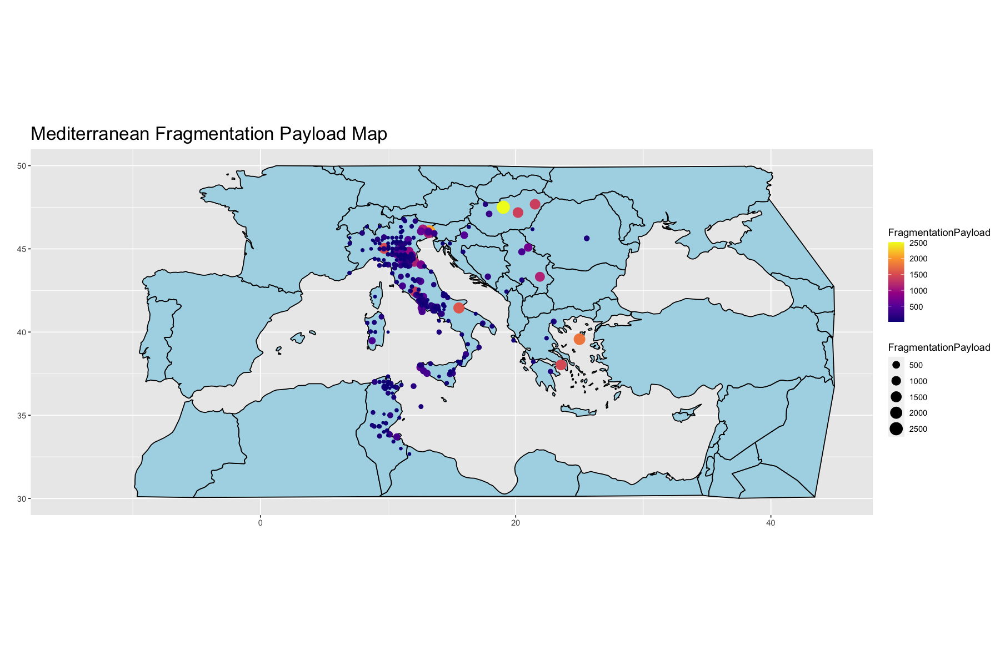

In [137]:


filtered_data <- air_operations_target_countries_med %>%
  slice_max(order_by = FragmentationPayload, n = 300)
  
options(repr.plot.width=15, repr.plot.height=10)

world_map <- map_data("world")

# Filter for Europe by a rough range of longitudes and latitudes
mediterranean_map <- world_map %>%
  filter(long > -15, long < 45, lat > 30, lat < 50)

ggplot(data = mediterranean_map) +
  geom_polygon(aes(x = long, y = lat, group = group), fill = "lightblue", color = "black") +
  xlim(-15, 45) +  # Adjust these limits to fit Europe snugly within the plot area
  ylim(30, 50) +
  scale_color_viridis_c(option='plasma') +
  geom_point(data = filtered_data, 
             aes(x = Target.Longitude, y = Target.Latitude, color = FragmentationPayload, size=FragmentationPayload)) +
  labs(title = "Mediterranean Fragmentation Payload Map", x = "", y = "") +
  theme(
  plot.title = element_text( size = 20)) +
  coord_quickmap()  # Use coord_quickmap for a better map projection


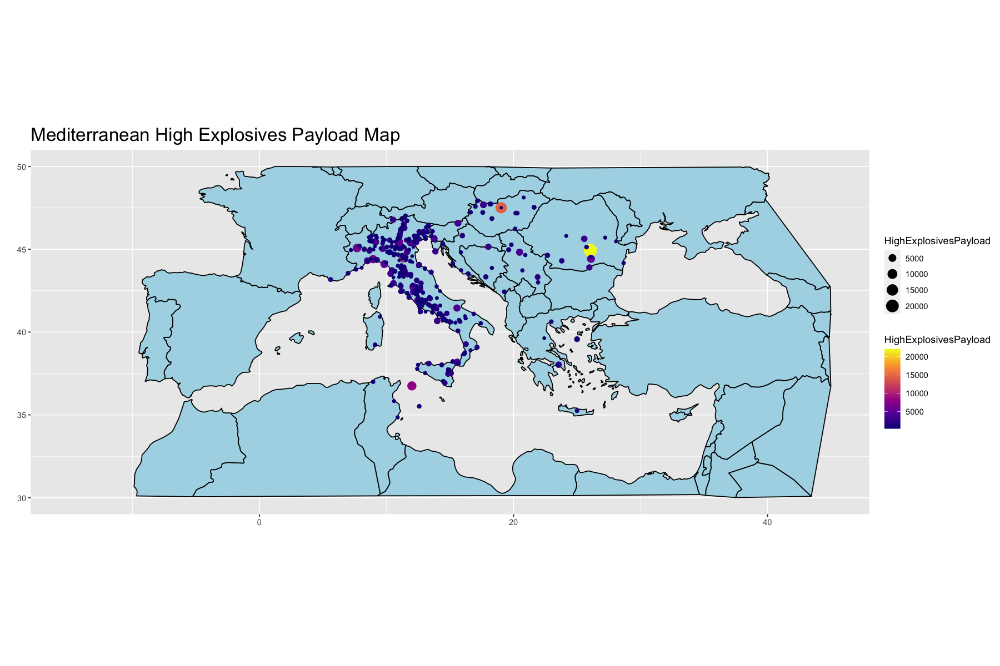

In [138]:


filtered_data <- air_operations_target_countries_med %>%
  slice_max(order_by = HighExplosivesPayload, n = 300)
  
options(repr.plot.width=15, repr.plot.height=10)

world_map <- map_data("world")

# Filter for Europe by a rough range of longitudes and latitudes
mediterranean_map <- world_map %>%
  filter(long > -15, long < 45, lat > 30, lat < 50)

ggplot(data = mediterranean_map) +
  geom_polygon(aes(x = long, y = lat, group = group), fill = "lightblue", color = "black") +
  xlim(-15, 45) +  # Adjust these limits to fit Europe snugly within the plot area
  ylim(30, 50) +
  scale_color_viridis_c(option='plasma') +
  geom_point(data = filtered_data, 
             aes(x = Target.Longitude, y = Target.Latitude, color = HighExplosivesPayload, size=HighExplosivesPayload)) +
  labs(title = "Mediterranean High Explosives Payload Map", x = "", y = "") +
  theme(
  plot.title = element_text( size = 20)) +
  coord_quickmap()  # Use coord_quickmap for a better map projection


## Pacific Visualizations

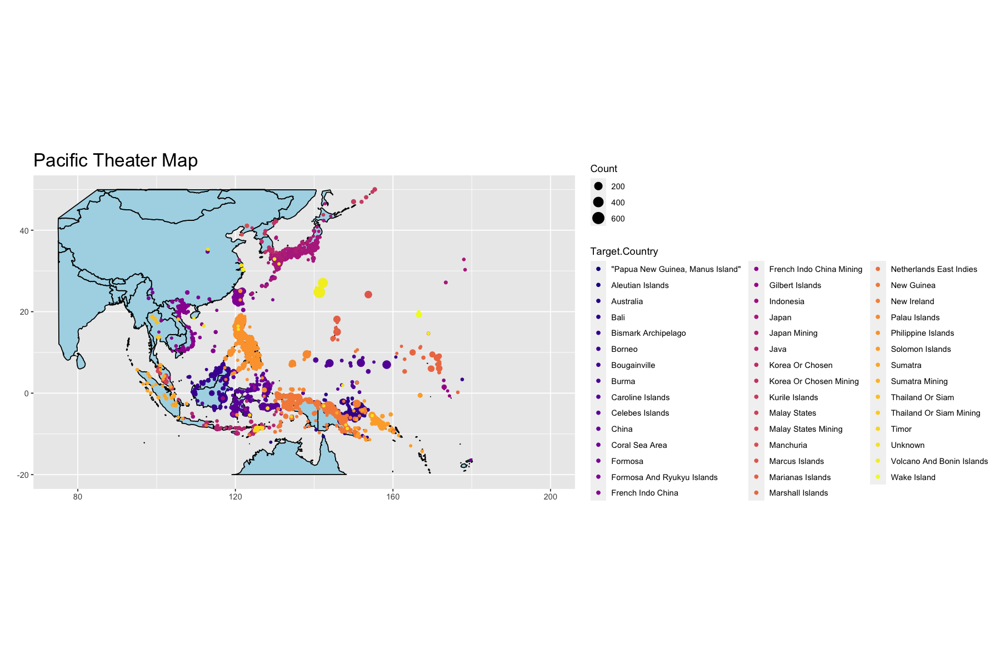

In [139]:

air_operations_target_countries_pacific = air_operations_target_countries %>% filter(Theater.of.Operations.Name == "Pacific Theater")

options(repr.plot.width=15, repr.plot.height=10)

world_map <- map_data("world")

# Filter for Europe by a rough range of longitudes and latitudes
pacific_map <- world_map %>%
  filter(long >= 75, long <= 200, lat <= 50, lat >= -20)

ggplot(data = pacific_map) +
  geom_polygon(aes(x = long, y = lat, group = group), fill = "lightblue", color = "black") +
  xlim(75, 200) +  
  ylim(-20, 50) +
  scale_color_viridis_d(option='plasma') +
  geom_point(data = air_operations_target_countries_pacific, 
             aes(x = Target.Longitude, y = Target.Latitude, color = Target.Country, size=Count)) +
  theme(
  plot.title = element_text( size = 20)) +
  labs(title = "Pacific Theater Map", x = "", y = "") +
  coord_quickmap()  # Use coord_quickmap for a better map projection


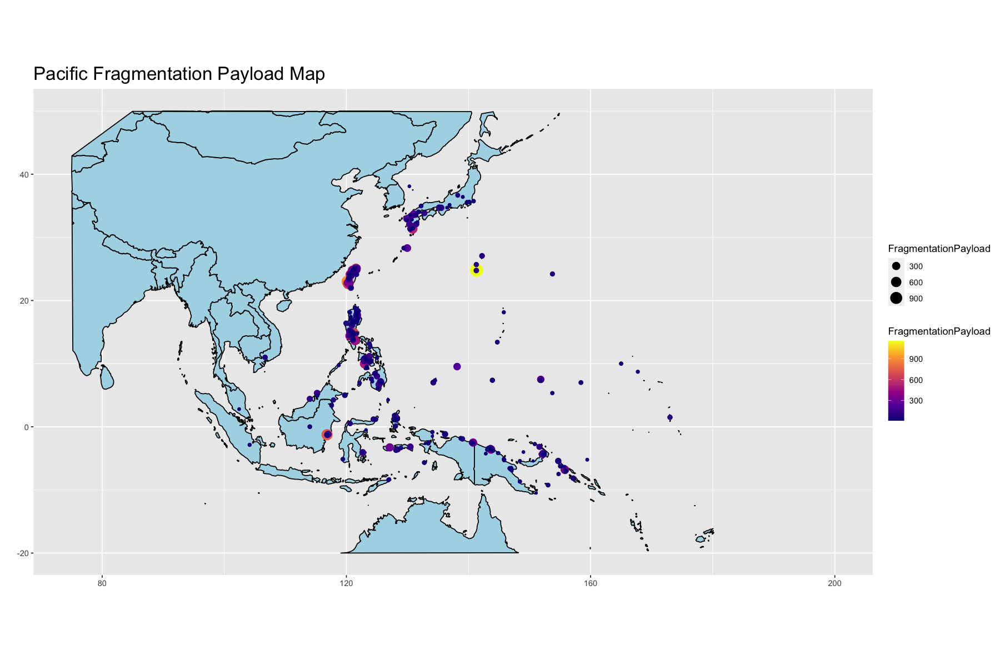

In [140]:

filtered_data <- air_operations_target_countries_pacific %>%
  slice_max(order_by = FragmentationPayload, n = 300)

options(repr.plot.width=15, repr.plot.height=10)

world_map <- map_data("world")

# Filter for Europe by a rough range of longitudes and latitudes
pacific_map <- world_map %>%
  filter(long >= 75, long <= 200, lat <= 50, lat >= -20)

ggplot(data = pacific_map) +
  geom_polygon(aes(x = long, y = lat, group = group), fill = "lightblue", color = "black") +
  xlim(75, 200) +  
  ylim(-20, 50) +
  scale_color_viridis_c(option='plasma') +
  geom_point(data = filtered_data, 
             aes(x = Target.Longitude, y = Target.Latitude, color = FragmentationPayload, size=FragmentationPayload)) +
  theme(
  plot.title = element_text( size = 20)) +
  labs(title = "Pacific Fragmentation Payload Map", x = "", y = "") +
  coord_quickmap()  # Use coord_quickmap for a better map projection


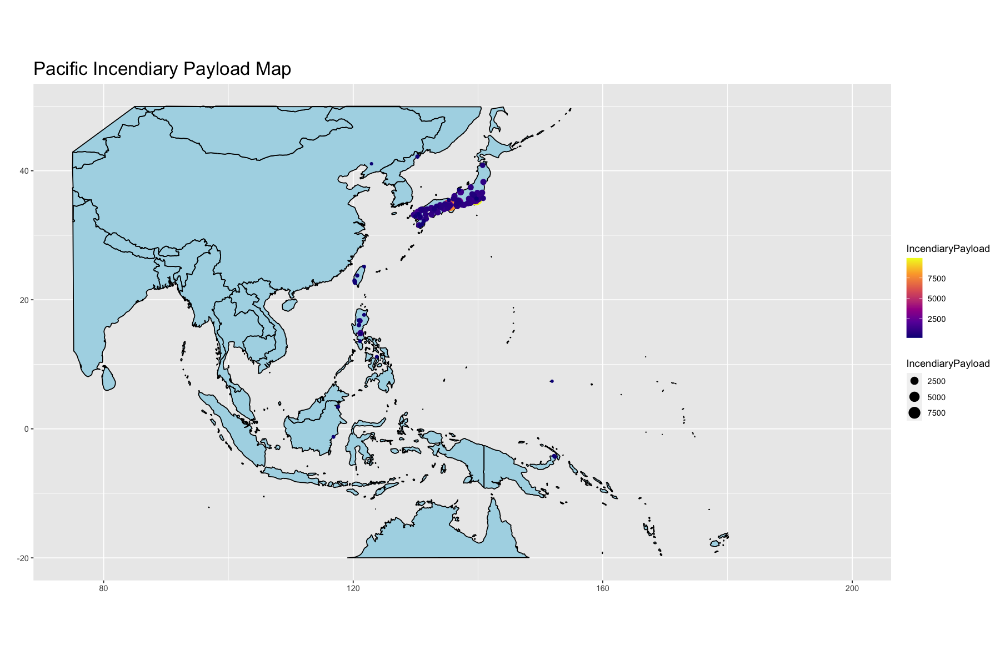

In [141]:

filtered_data <- air_operations_target_countries_pacific %>%
  slice_max(order_by = IncendiaryPayload, n = 100)

options(repr.plot.width=15, repr.plot.height=10)

world_map <- map_data("world")

# Filter for Europe by a rough range of longitudes and latitudes
pacific_map <- world_map %>%
  filter(long >= 75, long <= 200, lat <= 50, lat >= -20)

ggplot(data = pacific_map) +
  geom_polygon(aes(x = long, y = lat, group = group), fill = "lightblue", color = "black") +
  xlim(75, 200) +  
  ylim(-20, 50) +
  scale_color_viridis_c(option='plasma') +
  geom_point(data = filtered_data, 
             aes(x = Target.Longitude, y = Target.Latitude, color = IncendiaryPayload, size=IncendiaryPayload)) +
  theme(
  plot.title = element_text( size = 20)) +
  labs(title = "Pacific Incendiary Payload Map", x = "", y = "") +
  coord_quickmap()  # Use coord_quickmap for a better map projection


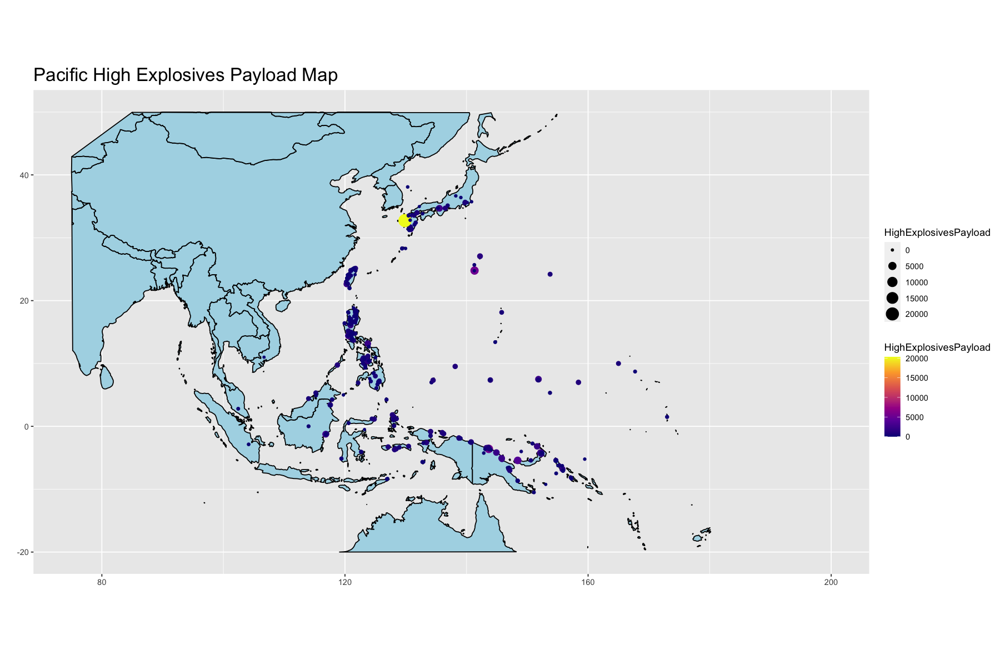

In [142]:

filtered_data <- air_operations_target_countries_pacific %>%
  slice_max(order_by = FragmentationPayload, n = 300)

options(repr.plot.width=15, repr.plot.height=10)

world_map <- map_data("world")

# Filter for Europe by a rough range of longitudes and latitudes
pacific_map <- world_map %>%
  filter(long >= 75, long <= 200, lat <= 50, lat >= -20)

ggplot(data = pacific_map) +
  geom_polygon(aes(x = long, y = lat, group = group), fill = "lightblue", color = "black") +
  xlim(75, 200) +  
  ylim(-20, 50) +
  scale_color_viridis_c(option='plasma') +
  geom_point(data = filtered_data, 
             aes(x = Target.Longitude, y = Target.Latitude, color = HighExplosivesPayload, size=HighExplosivesPayload)) +
  theme(
  plot.title = element_text( size = 20)) +
  labs(title = "Pacific High Explosives Payload Map", x = "", y = "") +
  coord_quickmap()  # Use coord_quickmap for a better map projection


### <font color=red>4. Is there a relationship between the number of tons of explosives dropped and the number of planes involved in a mission?</font>

Yes, it is quite evident across multiple data fields that there is a direct correlation with the number of planes involved in a mission and the size of the payload. It is of key interest that there are a few examples of extreme outliers. 

In [143]:
colnames(air_operations)

[1] "Mission.ID"                           
 [2] "Mission.Date"                         
 [3] "Theater.of.Operations"                
 [4] "Country"                              
 [5] "Air.Force"                            
 [6] "Unit.ID"                              
 [7] "Aircraft.Series"                      
 [8] "Callsign"                             
 [9] "Mission.Type"                         
[10] "Takeoff.Base"                         
[11] "Takeoff.Location"                     
[12] "Takeoff.Latitude"                     
[13] "Takeoff.Longitude"                    
[14] "Target.ID"                            
[15] "Target.Country"                       
[16] "Target.City"                          
[17] "Target.Type"                          
[18] "Target.Industry"                      
[19] "Target.Priority"                      
[20] "Target.Latitude"                      
[21] "Target.Longitude"                     
[22] "Altitude..Hundreds.of.Feet."          
[23] "Airborne.Aircraft"                    
[24] "Attacking.Aircraft"                   
[25] "Bombing.Aircraft"                     
[26] "Aircraft.Returned"                    
[27] "Aircraft.Failed"                      
[28] "Aircraft.Damaged"                     
[29] "Aircraft.Lost"                        
[30] "High.Explosives"                      
[31] "High.Explosives.Type"                 
[32] "High.Explosives.Weight..Pounds."      
[33] "High.Explosives.Weight..Tons."        
[34] "Incendiary.Devices"                   
[35] "Incendiary.Devices.Type"              
[36] "Incendiary.Devices.Weight..Pounds."   
[37] "Incendiary.Devices.Weight..Tons."     
[38] "Fragmentation.Devices"                
[39] "Fragmentation.Devices.Type"           
[40] "Fragmentation.Devices.Weight..Pounds."
[41] "Fragmentation.Devices.Weight..Tons."  
[42] "Total.Weight..Pounds."                
[43] "Total.Weight..Tons."                  
[44] "Time.Over.Target"                     
[45] "Bomb.Damage.Assessment"               
[46] "Source.ID"                            
[47] "Theater.of.Operations.Name"           
[48] "Mission.Date.Month"                   
[49] "Mission.Date.Year_Month"              
[50] "Mission.Date.Year"

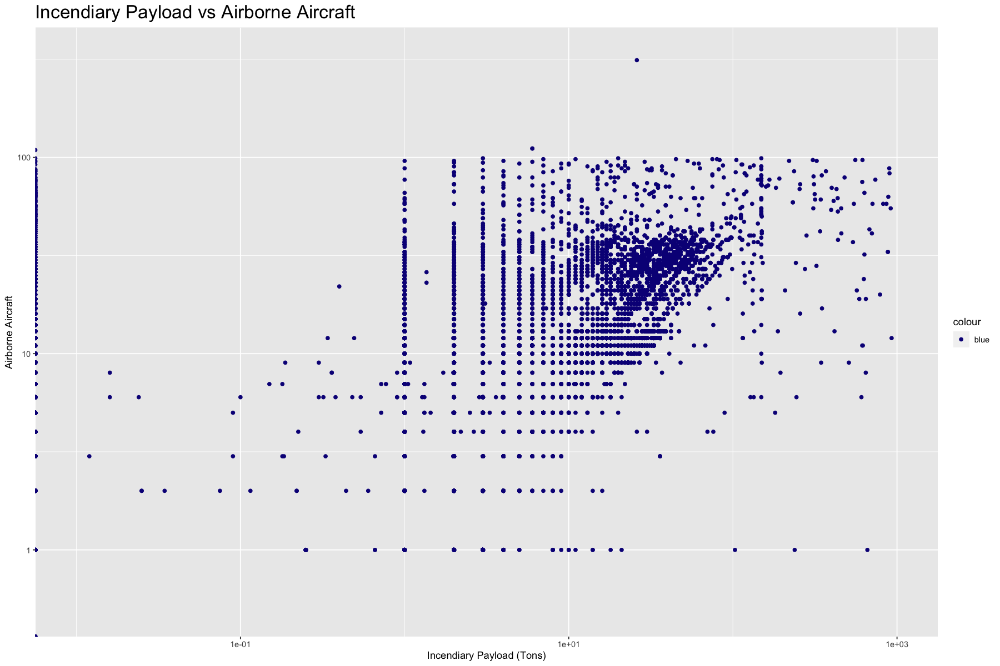

In [144]:
# scatter plot between incendiary payload and number of planes
ggplot(air_operations, aes(x = Incendiary.Devices.Weight..Tons., y = Airborne.Aircraft, color='blue')) +
  geom_point() +
  scale_x_log10() +
  scale_y_log10() +
  labs(title = "Incendiary Payload vs Airborne Aircraft", x = "Incendiary Payload (Tons)", y = "Airborne Aircraft") +
  theme(
  plot.title = element_text( size = 20)) +
  scale_color_viridis_d(option='plasma')

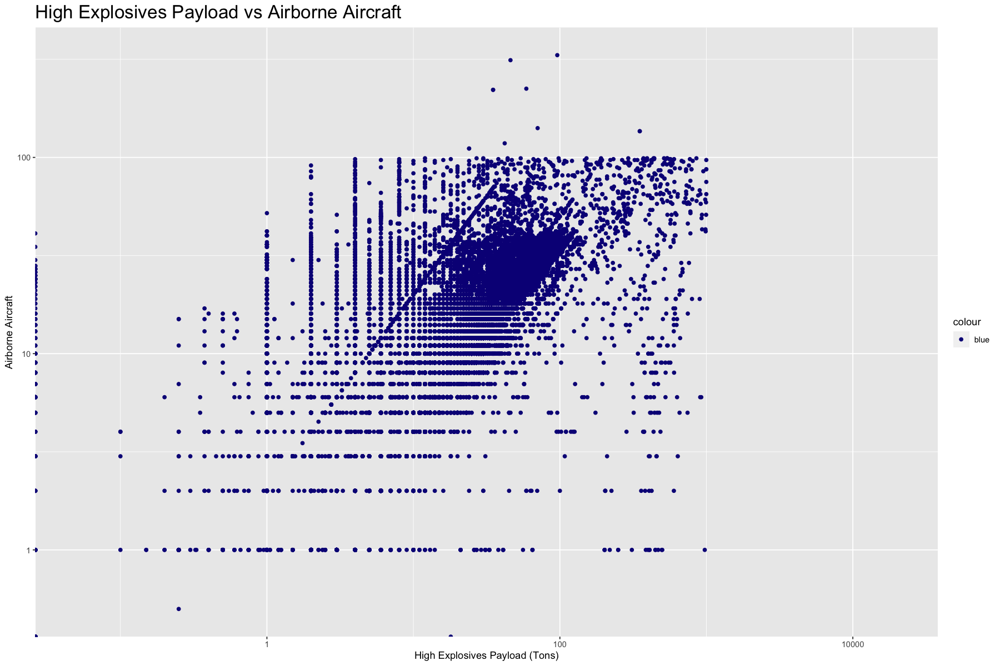

In [145]:
# scatter plot between incendiary payload and number of planes
ggplot(air_operations, aes(x = High.Explosives.Weight..Tons., y = Airborne.Aircraft, color='blue')) +
  geom_point() +
  scale_x_log10() +
  scale_y_log10() +
  labs(title = "High Explosives Payload vs Airborne Aircraft", x = "High Explosives Payload (Tons)", y = "Airborne Aircraft") +
  theme(
  plot.title = element_text( size = 20)) +
  scale_color_viridis_d(option='plasma')

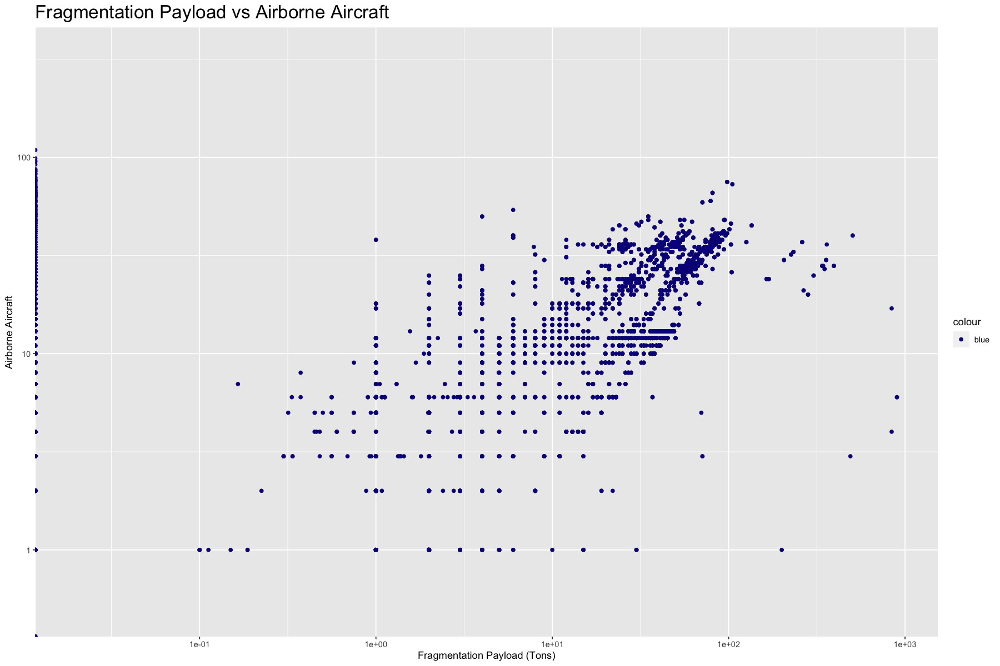

In [29]:
# scatter plot between incendiary payload and number of planes
ggplot(air_operations, aes(x = Fragmentation.Devices.Weight..Tons., y = Airborne.Aircraft, color='blue')) +
  geom_point() +
  scale_x_log10() +
  scale_y_log10() +
  labs(title = "Fragmentation Payload vs Airborne Aircraft", x = "Fragmentation Payload (Tons)", y = "Airborne Aircraft") +
  theme(
  plot.title = element_text( size = 20)) +
  scale_color_viridis_d(option='plasma')

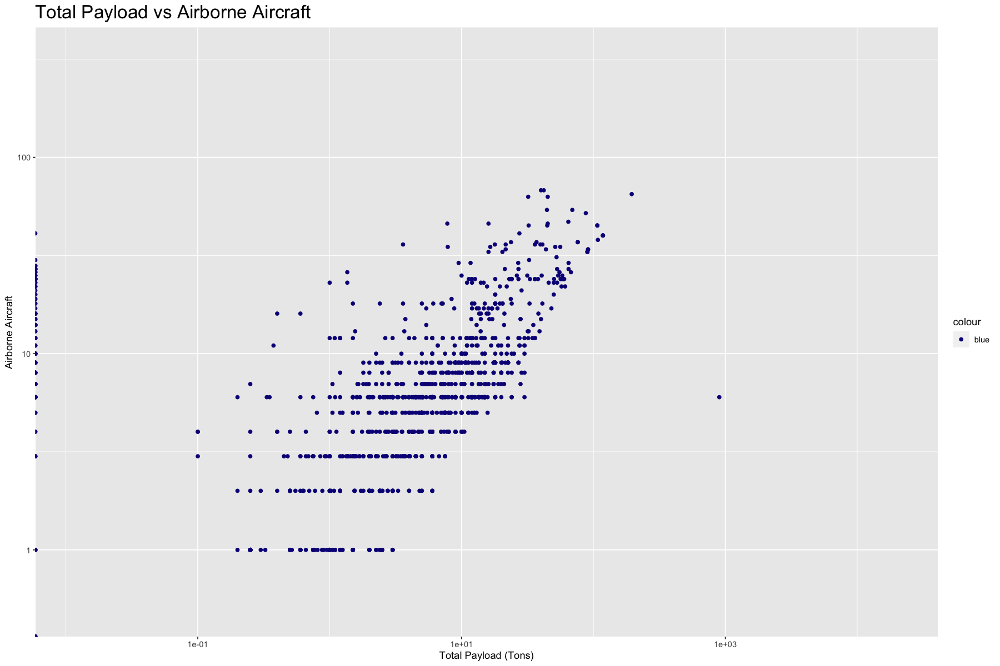

In [147]:
# create a new column for sum of all payloads

air_operations$TotalPayload <- air_operations$Incendiary.Devices.Weight..Tons. + air_operations$Fragmentation.Devices.Weight..Tons. + air_operations$High.Explosives.Weight..Tons.

# scatter plot between incendiary payload and number of planes
ggplot(air_operations, aes(x = TotalPayload, y = Airborne.Aircraft, color='blue')) +
  geom_point() +
  scale_x_log10() +
  scale_y_log10() +
  labs(title = "Total Payload vs Airborne Aircraft", x = "Total Payload (Tons)", y = "Airborne Aircraft") +
  theme(
  plot.title = element_text( size = 20)) +
  scale_color_viridis_d(option='plasma')

Interesting outlier is Nagasaki

In [148]:
# get row with max value of Total Payload

air_operations[which.max(air_operations$TotalPayload),c('Target.Country', 'Target.City', 'TotalPayload', 'Incendiary.Devices.Weight..Tons.', 'Fragmentation.Devices.Weight..Tons.', 'High.Explosives.Weight..Tons.')]

,Target.Country,Target.City,TotalPayload,Incendiary.Devices.Weight..Tons.,Fragmentation.Devices.Weight..Tons.,High.Explosives.Weight..Tons.
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
149865,Japan,Nagasaki,20000,0,0,20000


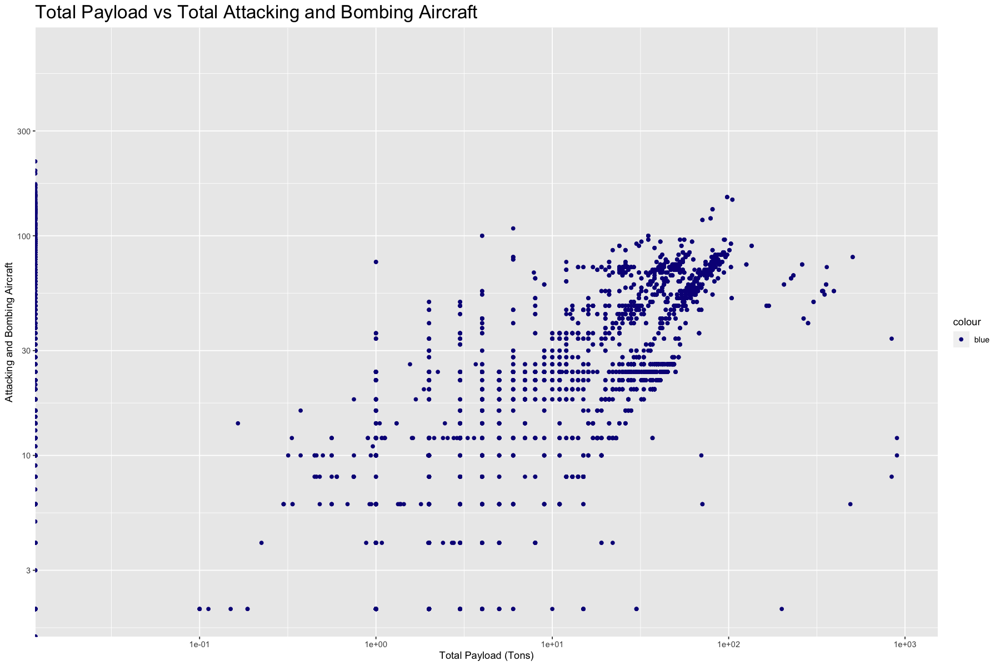

In [149]:
air_operations$TotalAircraft = air_operations$Attacking.Aircraft + air_operations$Bombing.Aircraft


# scatter plot between incendiary payload and number of planes
ggplot(air_operations, aes(x = Fragmentation.Devices.Weight..Tons., y = TotalAircraft, color='blue')) +
  geom_point() +
  scale_x_log10() +
  scale_y_log10() +
  labs(title = "Total Payload vs Total Attacking and Bombing Aircraft", x = "Total Payload (Tons)", y = "Attacking and Bombing Aircraft") +
  theme(
  plot.title = element_text( size = 20)) +
  scale_color_viridis_d(option='plasma')

### <font color=red>5. Create a visualisation of the timeline of aerial bombing operations. Group the mission months for all WW2 missions and show the total number of bombings from the onset to the end of WW2. What do you observe?</font>

Between 1944 and 1946 the most bombings occurred. 

In [150]:
colnames(air_operations)

[1] "Mission.ID"                           
 [2] "Mission.Date"                         
 [3] "Theater.of.Operations"                
 [4] "Country"                              
 [5] "Air.Force"                            
 [6] "Unit.ID"                              
 [7] "Aircraft.Series"                      
 [8] "Callsign"                             
 [9] "Mission.Type"                         
[10] "Takeoff.Base"                         
[11] "Takeoff.Location"                     
[12] "Takeoff.Latitude"                     
[13] "Takeoff.Longitude"                    
[14] "Target.ID"                            
[15] "Target.Country"                       
[16] "Target.City"                          
[17] "Target.Type"                          
[18] "Target.Industry"                      
[19] "Target.Priority"                      
[20] "Target.Latitude"                      
[21] "Target.Longitude"                     
[22] "Altitude..Hundreds.of.Feet."          
[23] "Airborne.Aircraft"                    
[24] "Attacking.Aircraft"                   
[25] "Bombing.Aircraft"                     
[26] "Aircraft.Returned"                    
[27] "Aircraft.Failed"                      
[28] "Aircraft.Damaged"                     
[29] "Aircraft.Lost"                        
[30] "High.Explosives"                      
[31] "High.Explosives.Type"                 
[32] "High.Explosives.Weight..Pounds."      
[33] "High.Explosives.Weight..Tons."        
[34] "Incendiary.Devices"                   
[35] "Incendiary.Devices.Type"              
[36] "Incendiary.Devices.Weight..Pounds."   
[37] "Incendiary.Devices.Weight..Tons."     
[38] "Fragmentation.Devices"                
[39] "Fragmentation.Devices.Type"           
[40] "Fragmentation.Devices.Weight..Pounds."
[41] "Fragmentation.Devices.Weight..Tons."  
[42] "Total.Weight..Pounds."                
[43] "Total.Weight..Tons."                  
[44] "Time.Over.Target"                     
[45] "Bomb.Damage.Assessment"               
[46] "Source.ID"                            
[47] "Theater.of.Operations.Name"           
[48] "Mission.Date.Month"                   
[49] "Mission.Date.Year_Month"              
[50] "Mission.Date.Year"                    
[51] "TotalPayload"                         
[52] "TotalAircraft"

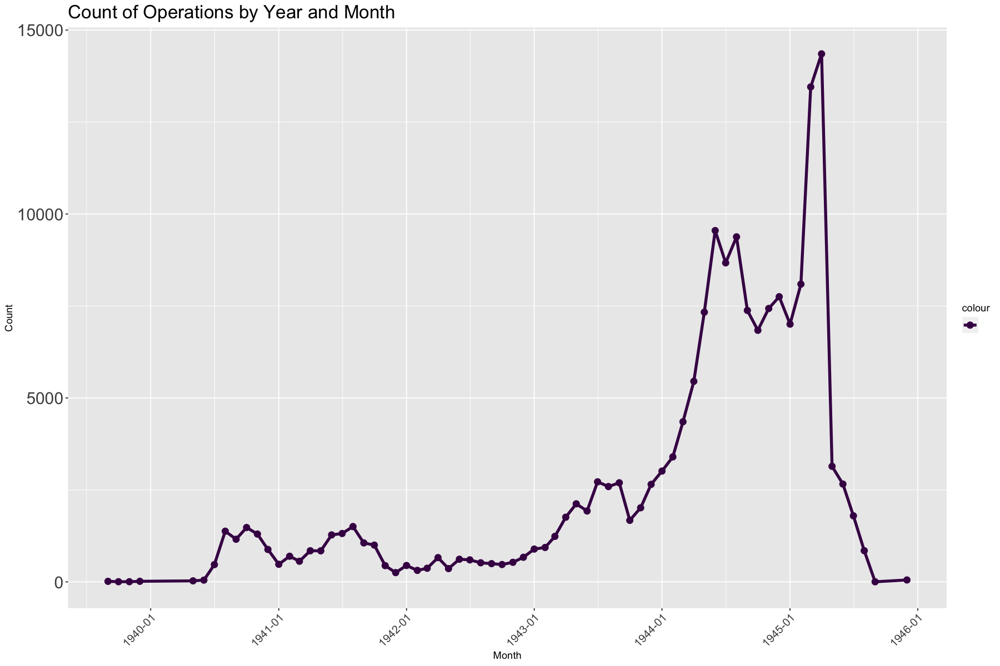

In [151]:
library(ggplot2)
library(dplyr)

# Assuming air_operations is already loaded
air_operations_target_countries <- air_operations %>%
  mutate(Mission.Date.Year_Month = as.Date(paste0(Mission.Date.Year_Month, "-01"))) %>%  # Ensure date format
  group_by(Mission.Date.Year_Month) %>%
  summarise(Count = n(), .groups = 'drop')

# Plot
ggplot(air_operations_target_countries, aes(x = Mission.Date.Year_Month, y = Count, color='')) +
  geom_line(size = 1.5) +
  geom_point(size = 3) +
  scale_color_viridis_d() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 12),
        axis.text.y = element_text(size = 18), 
        plot.title = element_text(size = 20), 
        ) +
  scale_x_date(date_breaks = "1 year", date_labels = "%Y-%m") +  # Adjust for appropriate date breaks and labels
  labs(title = "Count of Operations by Year and Month", x = "Month", y = "Count")


In [152]:


# group by 
air_operations_target_countries <- air_operations %>%
  mutate(Mission.Date.Year_Month = as.Date(paste0(Mission.Date.Year_Month, "-01"))) %>%  # Ensure date format
  group_by(Mission.Date.Year_Month) %>%
  summarise( .groups = 'drop', 
  IncendiaryPayload = sum(Incendiary.Devices.Weight..Tons., na.rm = TRUE),
  FragmentationPayload = sum(Fragmentation.Devices.Weight..Tons., na.rm = TRUE),
  HighExplosivesPayload = sum(High.Explosives.Weight..Tons., na.rm = TRUE)
  )

# convert to long df
air_operations_long <- air_operations_target_countries %>% 
  pivot_longer(cols = c(IncendiaryPayload, FragmentationPayload, HighExplosivesPayload), names_to = "PayloadType", values_to = "PayloadWeight")

print(air_operations_long[1:10,])


# A tibble: 10 x 3
   Mission.Date.Year_Month PayloadType           PayloadWeight
   <date>                  <chr>                         <dbl>
 1 1939-09-01              IncendiaryPayload                 0
 2 1939-09-01              FragmentationPayload              0
 3 1939-09-01              HighExplosivesPayload             0
 4 1939-10-01              IncendiaryPayload                 0
 5 1939-10-01              FragmentationPayload              0
 6 1939-10-01              HighExplosivesPayload             0
 7 1939-11-01              IncendiaryPayload                 0
 8 1939-11-01              FragmentationPayload              0
 9 1939-11-01              HighExplosivesPayload             0
10 1939-12-01              IncendiaryPayload                 0


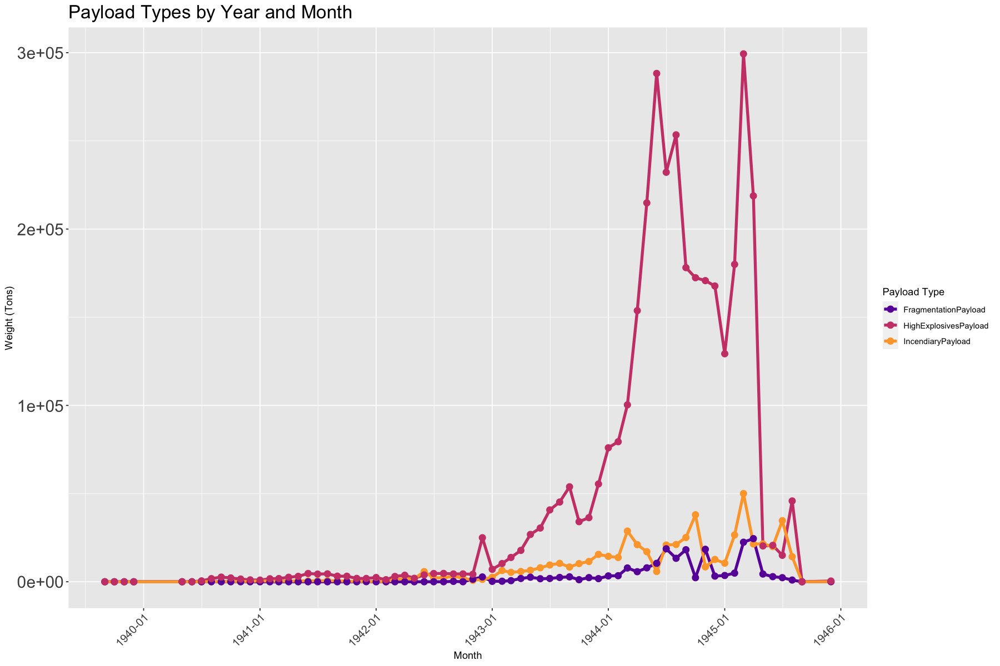

In [153]:
ggplot(air_operations_long, aes(x = Mission.Date.Year_Month, y = PayloadWeight, color = PayloadType)) +
  geom_line(size = 1.5) +
  geom_point(size = 3) +
  scale_color_viridis_d(begin = 0.2, end = 0.8, direction = 1, option = "plasma", aesthetics = "color") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 12),
        axis.text.y = element_text(size = 18), 
        plot.title = element_text(size = 20)) +
  scale_x_date(date_breaks = "1 year", date_labels = "%Y-%m") +
  labs(title = "Payload Types by Year and Month", x = "Month", y = "Weight (Tons)", color = "Payload Type")


### <font color=red>6. Does bombing increase for a specific period and for what theater?</font>

### <font color=red>Create a line chart of the total bombs dropped per month during WWII for the different Theaters of operation. What patterns do you observe?</font>

All theaters experience an increase in values dropped at the midpoint of 1944. After which bombings increase until late 1945. Specifically, the Pacific Theater increases the most during that period. 

For a period of time there is a significant amount of air striking that occurred in the Mediterranean Theater. Mostly on the Italian Peninsula. At the same time the Pacific Theater bombings increased dramatically. 

In [154]:
# group by 
air_operations_target_countries <- air_operations %>%
  mutate(Mission.Date.Year_Month = as.Date(paste0(Mission.Date.Year_Month, "-01"))) %>%  # Ensure date format
  group_by(Theater.of.Operations.Name, Mission.Date.Year_Month) %>%
  summarise( .groups = 'drop', Count = n()
  )

In [155]:

# get years
years <- unique(air_operations_target_countries$Mission.Date.Year_Month)

# get unique theaters
theaters <- unique(air_operations_target_countries$Theater.of.Operations.Name)

all_year_theater_combinations <- expand.grid(Mission.Date.Year_Month = years, Theater.of.Operations.Name = theaters)

# merge the data
air_operations_target_countries <- all_year_theater_combinations %>% left_join(air_operations_target_countries, by = c("Mission.Date.Year_Month", "Theater.of.Operations.Name"))

# fill na with 0
air_operations_target_countries$Count[is.na(air_operations_target_countries$Count)] <- 0


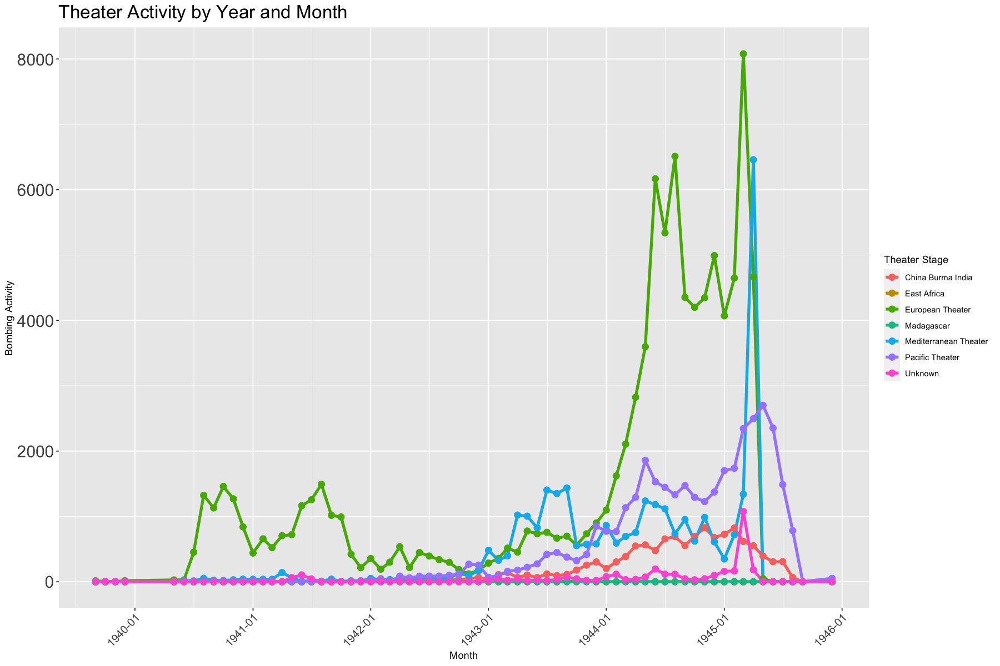

In [156]:
ggplot(air_operations_target_countries, aes(x = Mission.Date.Year_Month, y = Count, color = Theater.of.Operations.Name)) +
  geom_line(size = 1.5) +
  geom_point(size = 3) +
  theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 12),
        axis.text.y = element_text(size = 18), 
        plot.title = element_text(size = 20)) +
  scale_x_date(date_breaks = "1 year", date_labels = "%Y-%m") +
  labs(title = "Theater Activity by Year and Month", x = "Month", y = "Bombing Activity", color = "Theater Stage")


### <font color=red>7. The end-game: damage assessment between 1944-1945.</font>

### <font color=red>It is estimated that between 1944 to 1945, an average of 13K civilians were killed every month 400,000 by Allied carpet bombings. But German cities were not the only target of Allies’ strategic bombing. Create a density plot to show the distribution of High Explosives Weight (in Tons), as a function of target priority, for the window between 1944-1945. What patterns do you observe?</font>

5,6,7 priority targets did not get any Fragmentation Payloads, but received higher than usual incendiary and high explosive payloads. 

8 received neither Fragmentation nor Incendiary Payloads - this is where targets were mostly Japanese and Pacific Islands. 

In [157]:
# filter data to be between 1944 and 1945

air_operations_subset <- air_operations %>% filter(Mission.Date.Year >= 1944 & Mission.Date.Year <= 1945)

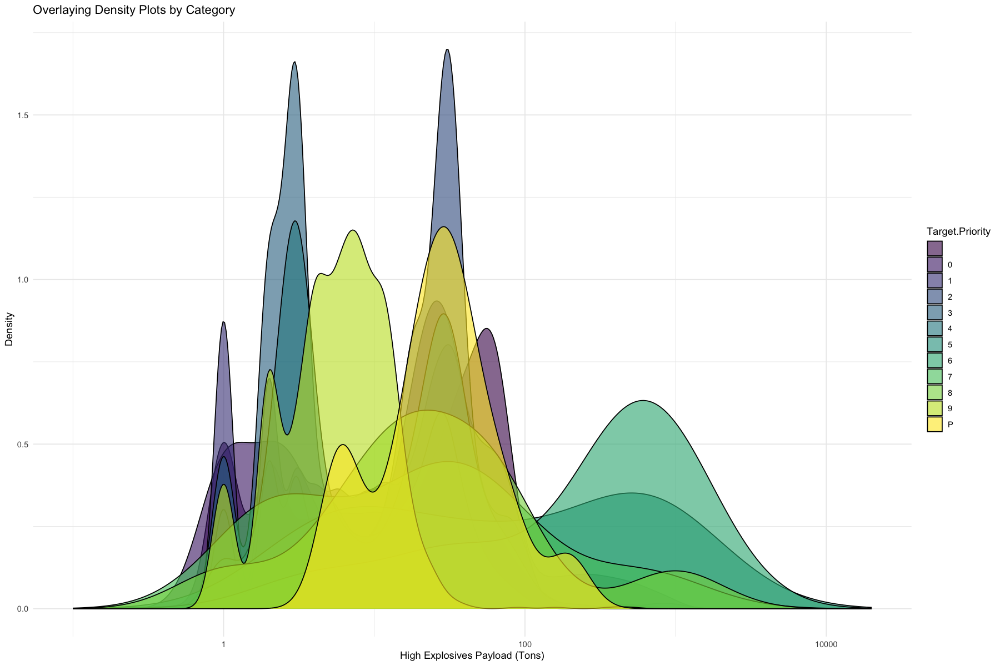

In [158]:
# drop outliers
air_operations_subset <- air_operations %>% filter(Mission.Date.Year >= 1944 & Mission.Date.Year <= 1945)



ggplot(air_operations_subset, aes(x = High.Explosives.Weight..Tons., fill = Target.Priority)) +
  geom_density(alpha = 0.6) +  # Adjust alpha for transparency
  scale_x_log10() +
  scale_fill_viridis_d() +  # Assuming viridis is desired and available
  labs(title = "Overlaying Density Plots by Category", x = "High Explosives Payload (Tons)", y = "Density") +
  theme_minimal()


Picking joint bandwidth of 38.9



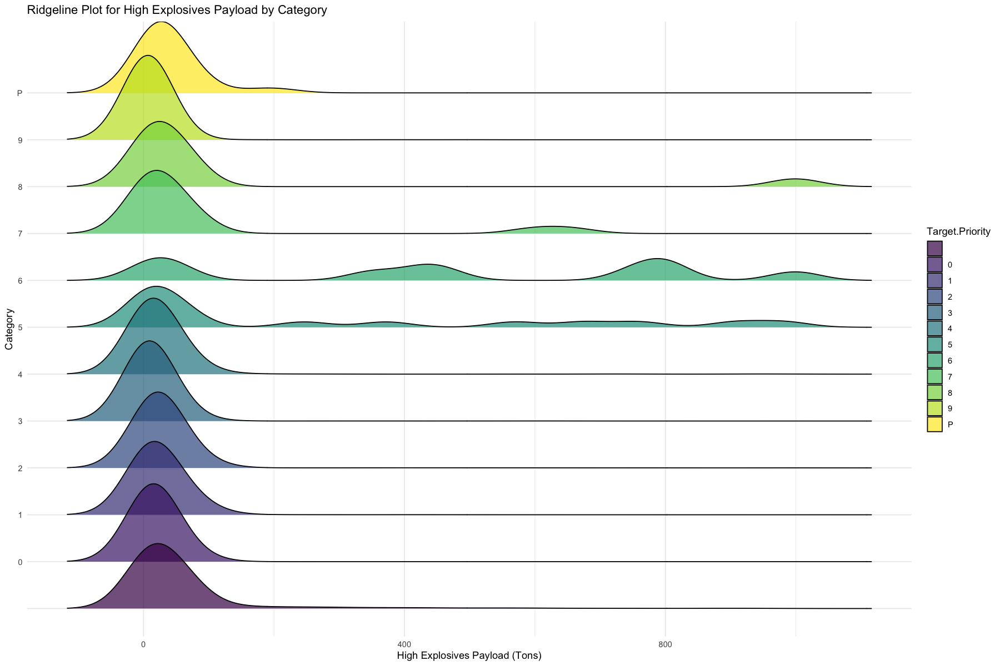

In [159]:
air_operations_subset <- air_operations %>% filter(Mission.Date.Year >= 1944 & Mission.Date.Year <= 1945)
air_operations_subset <- air_operations_subset %>% filter(High.Explosives.Weight..Tons. < 1000)

ggplot(air_operations_subset, aes(x = High.Explosives.Weight..Tons., y = Target.Priority, fill = Target.Priority)) +
  ggridges::geom_density_ridges(alpha = 0.7) +
  scale_fill_viridis_d() +
  labs(title = "Ridgeline Plot for High Explosives Payload by Category", x = "High Explosives Payload (Tons)", y = "Category") +
  theme_minimal()

Picking joint bandwidth of 32.3



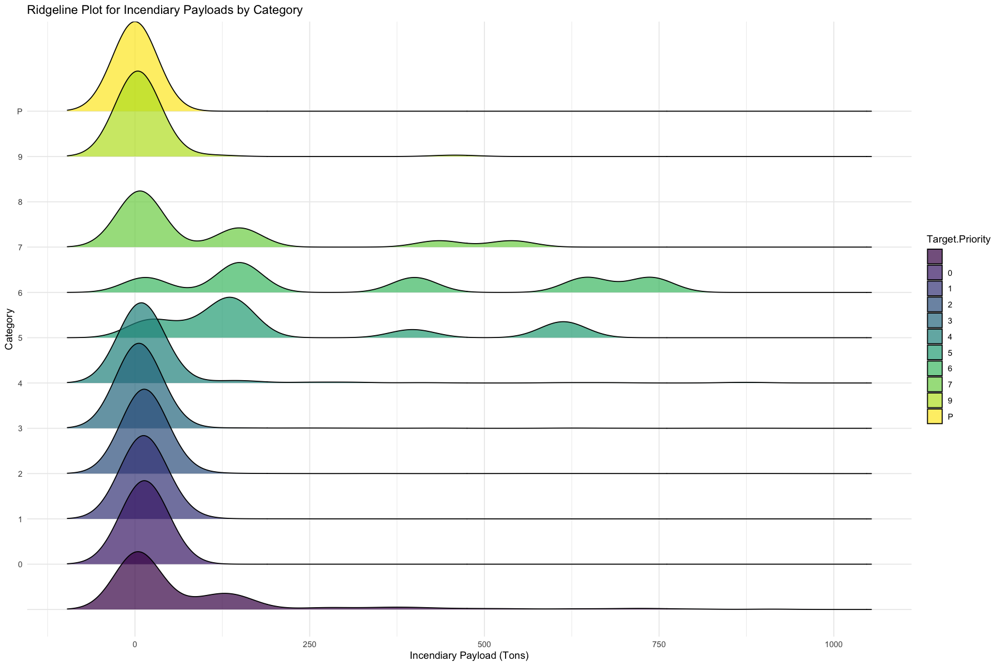

In [160]:

ggplot(air_operations_subset, aes(x = Incendiary.Devices.Weight..Tons., y = Target.Priority, fill = Target.Priority)) +
  ggridges::geom_density_ridges(alpha = 0.7) +
  scale_fill_viridis_d() +
  labs(title = "Ridgeline Plot for Incendiary Payloads by Category", x = "Incendiary Payload (Tons)", y = "Category") +
  theme_minimal()

Picking joint bandwidth of 5.09



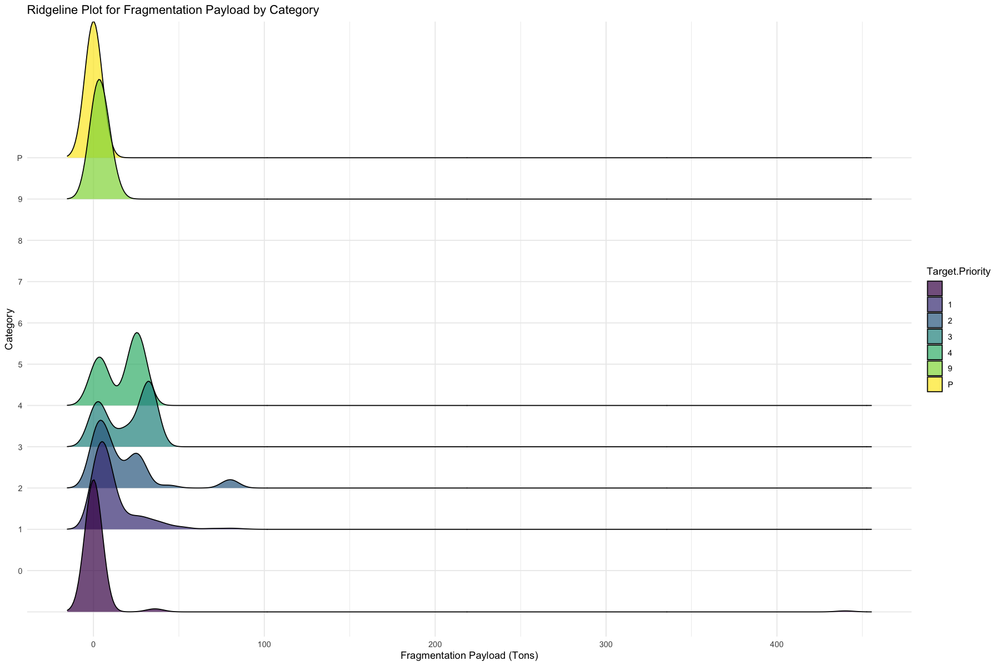

In [161]:

ggplot(air_operations_subset, aes(x = Fragmentation.Devices.Weight..Tons., y = Target.Priority, fill = Target.Priority)) +
  ggridges::geom_density_ridges(alpha = 0.7) +
  scale_fill_viridis_d() +
  labs(title = "Ridgeline Plot for Fragmentation Payload by Category", x = "Fragmentation Payload (Tons)", y = "Category") +
  theme_minimal()

In [162]:
# looking into targets for odd priority targets

air_operations_priorities <- air_operations %>% filter(Target.Priority == '5')

print(unique(air_operations_priorities[,c('Target.Country')]))


air_operations_priorities <- air_operations %>% filter(Target.Priority == '6')

print(unique(air_operations_priorities[,c('Target.Country')]))


air_operations_priorities <- air_operations %>% filter(Target.Priority == '7')

print(unique(air_operations_priorities[,c('Target.Country')]))


air_operations_priorities <- air_operations %>% filter(Target.Priority == '8')

print(unique(air_operations_priorities[,c('Target.Country')]))

[1] "Germany"            "France"             "Philippine Islands"
[4] "Japan"             
[1] "Germany"           "French Indo China" "France"           
[1] "Germany"            "Borneo"             "Philippine Islands"
[1] "Austria"          "France"           "Germany"          "Burma"           
[5] "Marshall Islands" "Caroline Islands" "Japan"           


### <font color=red>8. What is the most common number of bombs dropped per mission? To address this question, create a histogram of the number of bombs dropped per mission.</font>

when there is actually bombs dropped there is approximately 200-300 bombs dropped most usually, and 56.89 bombs dropped on average. However, most missions did not drop any bombs. Some missions dropped over 10,000 bombs. 

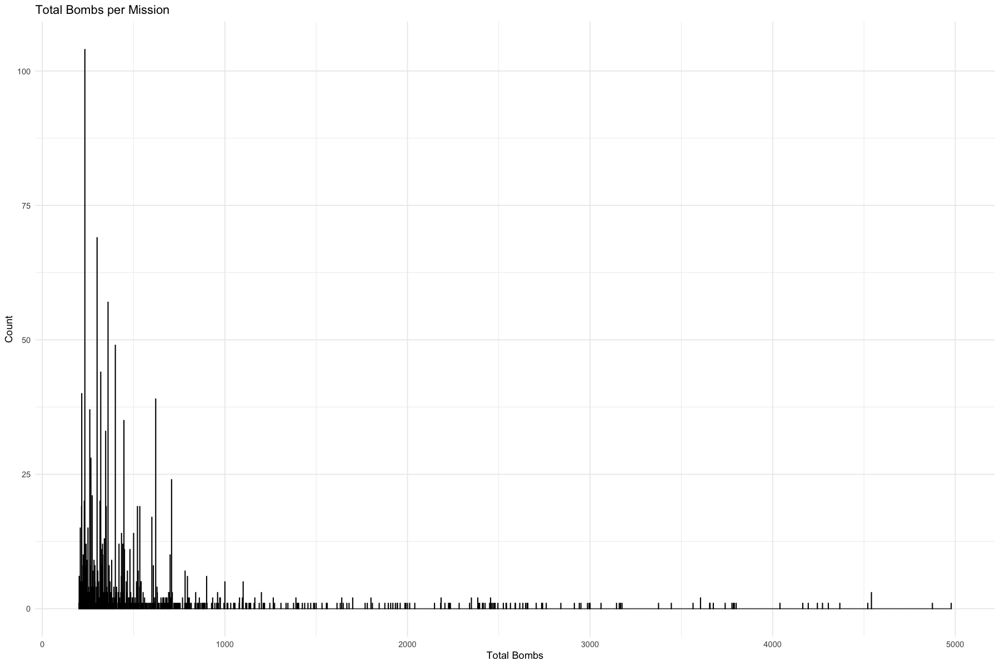

In [177]:

# sum of all bombs
air_operations$TotalBombs <- air_operations$Incendiary.Devices + air_operations$Fragmentation.Devices + air_operations$High.Explosives

# group by mission
air_operations_mission <- air_operations %>% group_by(Mission.ID) %>% summarise(TotalBombs = sum(TotalBombs), .groups = 'drop')

# histogram of total bombs
air_operations_mission_filtered <- air_operations_mission[(air_operations_mission$TotalBombs > 200) &(air_operations_mission$TotalBombs < 5000), ]

ggplot(air_operations_mission_filtered, aes(x = TotalBombs)) +
  geom_histogram(binwidth = 1, fill = "lightblue", color = "black") +
  labs(title = "Total Bombs per Mission", x = "Total Bombs", y = "Count") +
  theme_minimal()



dialing in more as most frequent are less than 1000

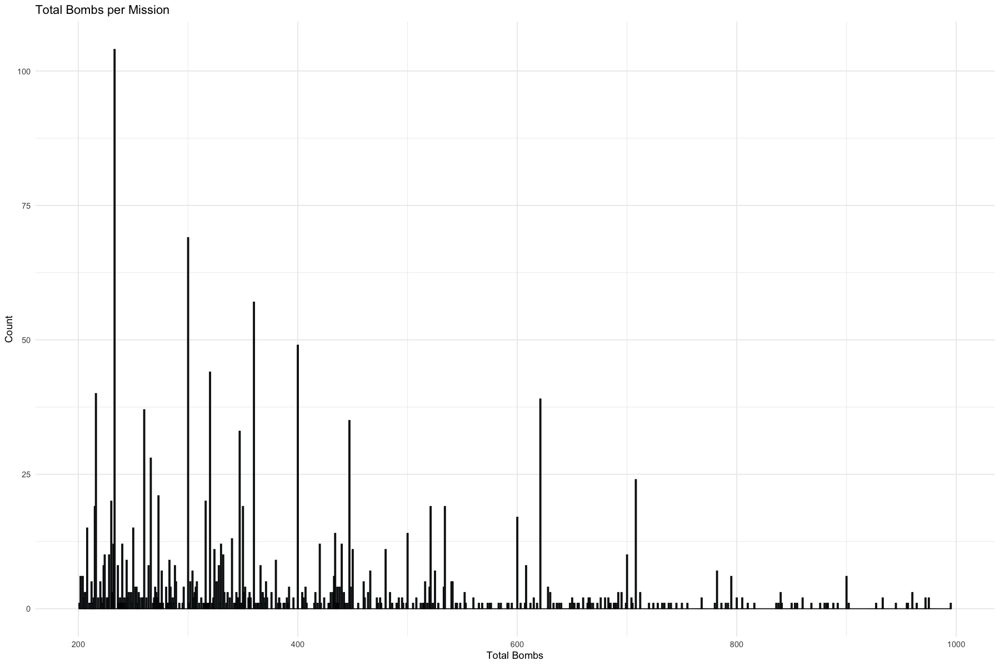

In [179]:

# sum of all bombs
air_operations$TotalBombs <- air_operations$Incendiary.Devices + air_operations$Fragmentation.Devices + air_operations$High.Explosives

# group by mission
air_operations_mission <- air_operations %>% group_by(Mission.ID) %>% summarise(TotalBombs = sum(TotalBombs), .groups = 'drop')

# histogram of total bombs
air_operations_mission_filtered <- air_operations_mission[(air_operations_mission$TotalBombs > 200) &(air_operations_mission$TotalBombs < 1000), ]

ggplot(air_operations_mission_filtered, aes(x = TotalBombs)) +
  geom_histogram(binwidth = 1, fill = "lightblue", color = "black") +
  labs(title = "Total Bombs per Mission", x = "Total Bombs", y = "Count") +
  theme_minimal()



scoping in one more time

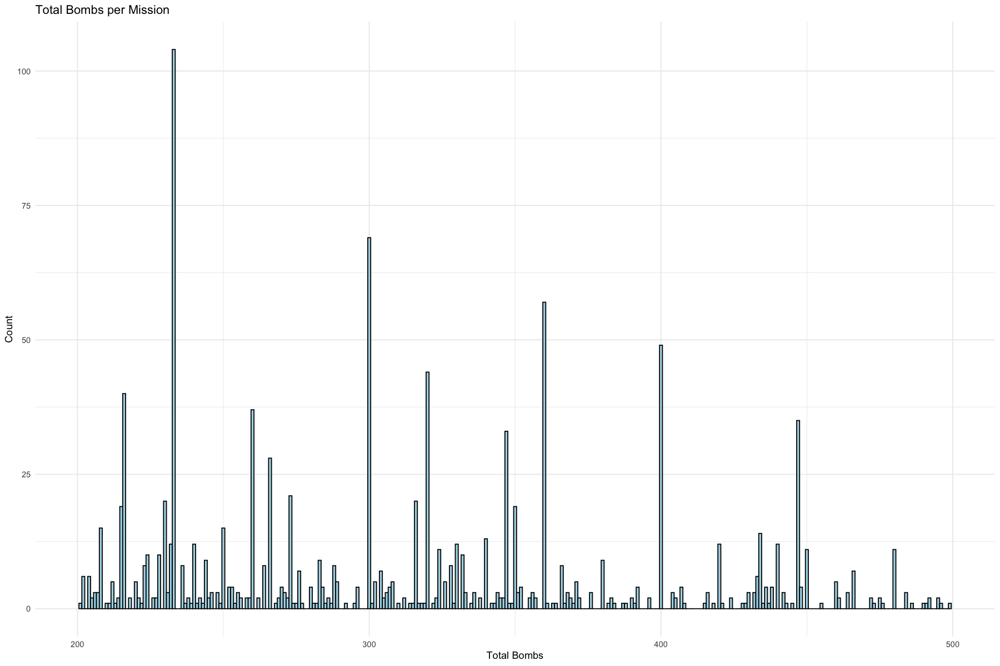

In [180]:

# sum of all bombs
air_operations$TotalBombs <- air_operations$Incendiary.Devices + air_operations$Fragmentation.Devices + air_operations$High.Explosives

# group by mission
air_operations_mission <- air_operations %>% group_by(Mission.ID) %>% summarise(TotalBombs = sum(TotalBombs), .groups = 'drop')

# histogram of total bombs
air_operations_mission_filtered <- air_operations_mission[(air_operations_mission$TotalBombs > 200) &(air_operations_mission$TotalBombs < 500), ]

ggplot(air_operations_mission_filtered, aes(x = TotalBombs)) +
  geom_histogram(binwidth = 1, fill = "lightblue", color = "black") +
  labs(title = "Total Bombs per Mission", x = "Total Bombs", y = "Count") +
  theme_minimal()



In [164]:
# Incendiary devices fill na with 0
air_operations$Incendiary.Devices[is.na(air_operations$Incendiary.Devices)] <- 0
air_operations$Incendiary.Devices <- as.integer(air_operations$Incendiary.Devices)

# Fragmentation devices fill na with 0
air_operations$Fragmentation.Devices[is.na(air_operations$Fragmentation.Devices)] <- 0
air_operations$Fragmentation.Devices <- as.integer(air_operations$Fragmentation.Devices)

# High Explosives fill na with 0
air_operations$High.Explosives[is.na(air_operations$High.Explosives)] <- 0
air_operations$High.Explosives <- as.integer(air_operations$High.Explosives)


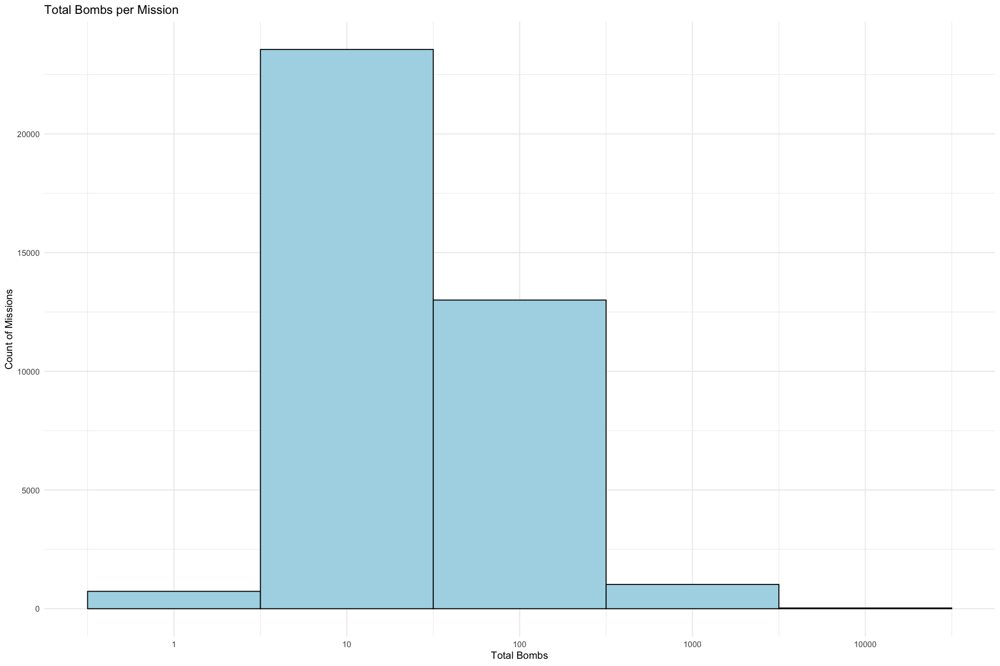

In [165]:

# sum of all bombs
air_operations$TotalBombs <- air_operations$Incendiary.Devices + air_operations$Fragmentation.Devices + air_operations$High.Explosives

# group by mission
air_operations_mission <- air_operations %>% group_by(Mission.ID) %>% summarise(TotalBombs = sum(TotalBombs), .groups = 'drop')

# histogram of total bombs

ggplot(air_operations_mission, aes(x = TotalBombs)) +
scale_x_log10() +
  geom_histogram(binwidth = 1, fill = "lightblue", color = "black") +
  labs(title = "Total Bombs per Mission", x = "Total Bombs", y = "Count of Missions") +
  theme_minimal()



In [182]:


# get mode of total bombs
print(mean(air_operations$TotalBombs[(air_operations_mission$TotalBombs > 0)], na.rm = TRUE))

# fill na with 0
air_operations_mission$TotalBombs[is.na(air_operations_mission$TotalBombs)] <- 0

# get mode of total bombs excluding 0
modes = (mode(air_operations_mission$TotalBombs[air_operations_mission$TotalBombs > 0]))

#print all modes in vector
print(modes[0])

[1] 56.89526


character(0)


In [168]:
print(max(air_operations_mission$TotalBombs))

[1] 10001


### Additional

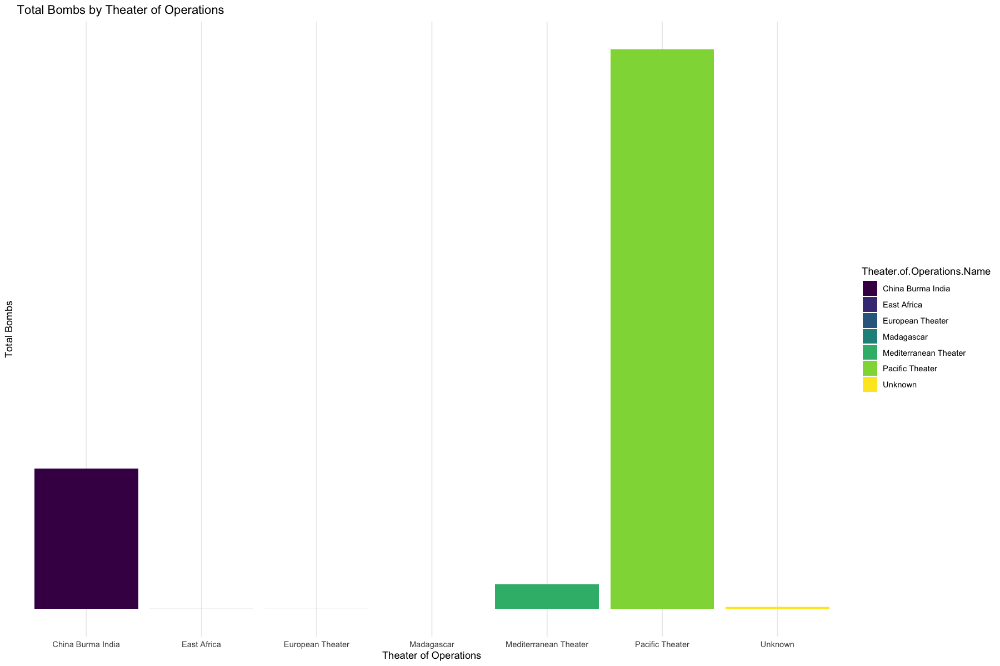

In [167]:
# additional analysis: see bomb damage assessment by theater of operations

ggplot(air_operations, aes(x = Theater.of.Operations.Name, y = TotalBombs, fill = Theater.of.Operations.Name)) +
  geom_col() +
  scale_fill_viridis_d() +
  scale_y_log10() +
  labs(title = "Total Bombs by Theater of Operations", x = "Theater of Operations", y = "Total Bombs") +
  theme_minimal()

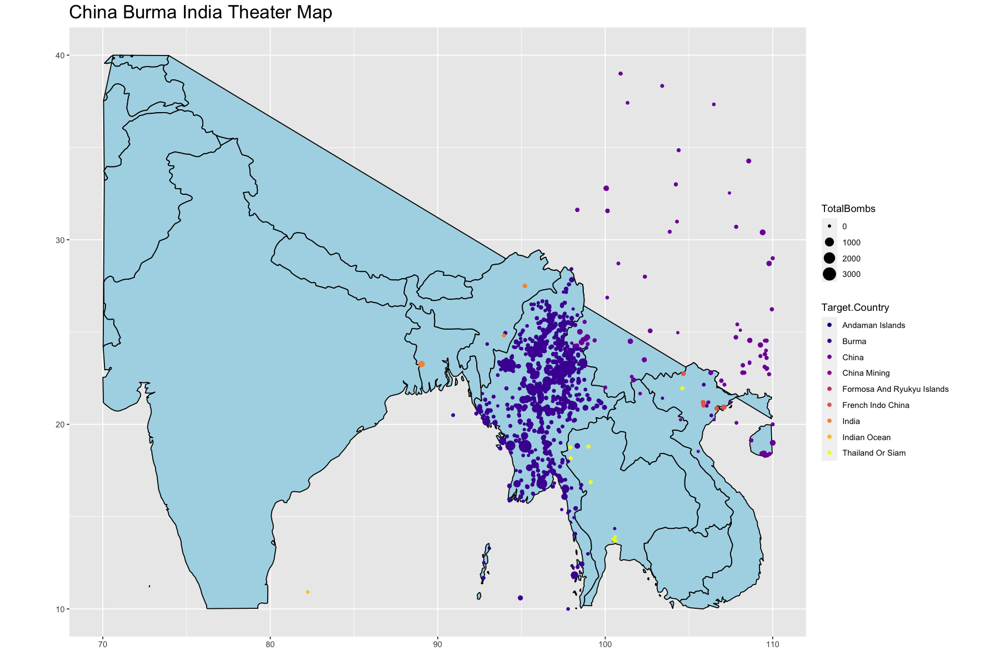

In [319]:
# look into China Burma India Theater

air_operations_cbi <- air_operations %>% filter(Theater.of.Operations.Name == "China Burma India")

# plot target lat and lng on map

options(repr.plot.width=15, repr.plot.height=10)

world_map <- map_data("world")

# Filter for China by a rough range of longitudes and latitudes
cbi_map <- world_map %>%
  filter(long > 70, long < 110, lat > 10, lat < 40)

ggplot(data = cbi_map) +
    geom_polygon(aes(x = long, y = lat, group = group), fill = "lightblue", color = "black") +
    xlim(70, 110) +  # Adjust these limits to fit China snugly within the plot area
    ylim(10, 40) +
    geom_point(data = air_operations_cbi, 
                 aes(x = Target.Longitude, y = Target.Latitude, color = Target.Country, size=TotalBombs)) +
    scale_color_viridis_d(option='plasma') +
    labs(title = "China Burma India Theater Map", x = "", y = "") +
    theme(
    plot.title = element_text( size = 20)) +
    coord_quickmap()  # Use coord_quickmap for a better map projection